In [55]:
!pip install gurobipy

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, Concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F

import gurobipy as gp
from gurobipy import GRB

# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None


# 25-26


In [57]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=21

cols = [

    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP', 'xP_next',
    'selected_by_percent','value', 'form', 'value_form', 'chance_of_playing_next_round', 'chance_of_playing_this_round',
    'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers',
    # 'influence', 'creativity', 'threat', 'ict_index',
    'elo', 'strength',
    'strength_overall_home', 'strength_overall_away', 'strength_attack_home', 'strength_attack_away', 'strength_defence_home', 'strength_defence_away',
    'team_h_difficulty', 'team_a_difficulty', 'win_prob', 'draw_prob', 'lose_prob',


    'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    'recoveries_1', 'recoveries_3', 'recoveries_5', 'defensive_contribution_1', 'defensive_contribution_3', 'defensive_contribution_5', 'selected_by_percent_1',
    'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',


    'opp_elo', 'opp_strength']


## Data Prep


In [ ]:
data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)

# pos_map = {
#     'Goalkeeper': 'GK',
#     '1': 'GK',
#     'Defender': 'DEF',
#     '2': 'DEF',
#     'Midfielder': 'MID',
#     '3': 'MID',
#     'Forward': 'FWD',
#     '4': 'FWD'
# }
# data_25_26['position'] = data_25_26['position'].map(pos_map)
data_25_26 = data_25_26[(data_25_26['minutes_1'] > 0) | (data_25_26['minutes_3'] >= 0) ]

active_data = data_25_26[cols].copy()
active_data_ = active_data.copy()


active_data_['opponent_difficulty'] = active_data_.apply(
    lambda row: (row['draw_prob'] + row['lose_prob'])
    if row['was_home']
    else (row['draw_prob'] + row['win_prob']),
    axis=1
)

active_data_['team_difficulty'] = active_data_.apply(
    lambda row: (row['draw_prob'] + row['lose_prob'])
    if not row['was_home']
    else (row['draw_prob'] + row['win_prob']),
    axis=1
)



CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP,xP_next,selected_by_percent,value,form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
0,1.0,1,Raya,1.0,False,4.2,4.2,36.9,55.0,3.2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,2,Raya,1.0,True,9.0,7.5,21.5,55.0,8.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,3,Raya,1.0,False,5.5,6.5,21.8,55.0,6.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,4,Raya,1.0,True,6.5,6.0,23.5,55.0,6.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,4.0,24.0,55.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6629,788.0,21,Kukonki,14.0,False,0.0,-0.5,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6630,789.0,21,Merrick,7.0,False,0.0,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6631,790.0,21,Williams-Barnett,18.0,False,0.0,0.0,0.0,45.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6632,791.0,21,Taty,19.0,True,0.0,1.9,0.0,55.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


### Functions


In [59]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    if 'team_difficulty' not in cols_:
        cols_.append('team_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name', ]
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['opponent_difficulty' , 'team_difficulty' , 'was_home'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X = data_[X_cols].drop(columns=['fpl_id', 'team_id'])
    X = X.fillna(0).values.astype(np.float32)

    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values




    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols

def transform_data(final_df, cols, gw):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = gw - 1
    GW_TRAIN_START = GW_TRAIN_END - 10
    train_mask = (GW_full >= GW_TRAIN_START) & (GW_full <= GW_TRAIN_END)
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw = X_full[test_mask], M_full[test_mask], Y_full[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names), GW_full, X_cols#, scaler_x, scaler_m

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.001

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)

    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='relu', name='Affine_Cond_1')([x, M_input])

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y, activation='linear', name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Pred_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


### Optimizers


#### IRL for HEPs


In [60]:
def greedy_expert_strategy(players, hist_xp=None, K=15, max_team_ratio=3, corr_threshold=0.8):
    """
    Greedy selection that picks top xP_pred players while respecting
    team (club) caps and avoiding players highly correlated in historical xP.
    Returns a binary selection vector for the N players.
    (Paper: Heuristic-Guided Inverse RL -> Expert Trajectory Generation)
    """
    N = len(players)
    # Prioritize higher predicted points
    order = players.sort_values('xP_pred', ascending=False).index.tolist()
    selected = []
    team_counts = {}

    # Compute correlation matrix if hist_xp provided
    corr = None
    if hist_xp is not None:
        try:
            # Use Pearson correlation (linear relationship)
            corr = np.corrcoef(hist_xp, rowvar=False)
            corr = np.nan_to_num(corr)
        except Exception:
            corr = None

    for idx in order:
        if len(selected) >= K:
            break

        # Check FPL Club Constraint (Heuristic Rule 1)
        team = players.loc[idx, 'team']
        if team_counts.get(team, 0) >= max_team_ratio:
            continue

        # Check Correlation Constraint (Heuristic Rule 2: Correlation Control)
        if corr is not None and len(selected) > 0:
            # Calculate average positive correlation with already selected players
            selected_indices = [players.index.get_loc(s) for s in selected]
            player_idx = players.index.get_loc(idx)

            # Avg positive correlation with selected players
            correlations = [corr[player_idx, s_idx] for s_idx in selected_indices if corr[player_idx, s_idx] > 0]
            if correlations and np.mean(correlations) >= corr_threshold:
                continue

        selected.append(players.loc[idx, 'player_id'])
        team_counts[team] = team_counts.get(team, 0) + 1

    # Return selection vector based on original index (player_id)
    sel_vec = np.zeros(N, dtype=int)
    for p_id in selected:
        sel_vec[p_id] = 1
    return sel_vec

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

# -------------------------------------------------------------------------
# 3. REWARD LEARNING (MAXENT IRL)
# -------------------------------------------------------------------------

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
        Fits RewardNetwork to assign higher reward to expert-selected players.
        (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        # Maximizing E_expert[R] equivalent to Minimizing -E_expert[R]

        # Safe division
        expert_sum = expert_mask.sum()
        if expert_sum == 0:
            expert_term = 0
        else:
            expert_term = (r * expert_mask).sum() / expert_sum

        loss = - expert_term
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()

        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        ptp = np.ptp(learned_r)
        if ptp == 0: ptp = 1e-8
        learned_r = (learned_r - learned_r.min()) / ptp
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Simplified MaxEnt IRL training -------------------

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
    Fits RewardNetwork to assign higher reward to expert-selected players.
    (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        loss = - (r * expert_mask).sum() / expert_mask.sum()  # Maximize E_expert[R]
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()
        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        # learned_r.ptp()
        learned_r = (learned_r - learned_r.min()) / (np.ptp(learned_r) + 1e-8)
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Heterogeneous Graph Attention -------------------

class HGATPolicy(nn.Module):
    """
    A small HGAT that uses GATConv (if available) to produce player embeddings.
    (Paper: Heterogeneous Graph Policy Learning)
    """
    def __init__(self, in_dim, out_dim=32, heads=4):
        super().__init__()
        if GATConv is None:
            # fallback: MLP
            self.fallback = True
            self.mlp = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64, out_dim))
        else:
            self.fallback = False
            self.conv1 = GATConv(in_dim, 32, heads=heads, concat=True)
            self.conv2 = GATConv(32*heads, out_dim, heads=1, concat=False)

    def forward(self, x, edge_index=None):
        if self.fallback:
            return self.mlp(x)
        else:
            # Here, the HGAT would combine information from correlation graphs and team graphs.
            h = F.elu(self.conv1(x, edge_index))
            h = self.conv2(h, edge_index)
            return h


def ilp_select_squad(players, combined_score, budget=100.0):
    N = len(players)
    m = gp.Model("FPL_11_Man_Squad")
    m.Params.OutputFlag = 0

    # 1. Decision Variables
    x = m.addVars(N, vtype=GRB.BINARY, name="x_selected")    # The 11 starters
    z = m.addVars(N, vtype=GRB.BINARY, name="z_captain")     # The Captain
    v = m.addVars(N, vtype=GRB.BINARY, name="v_vice")        # The Vice-Captain

    # 2. Objective Function
    # We maximize: Starter Scores + Captain Bonus.
    # (Vice-captain only scores bonus if captain doesn't play, but for optimization,
    # we usually maximize the primary captain's output).
    m.setObjective(
        gp.quicksum(combined_score[i] * x[i] for i in range(N)) +
        gp.quicksum(combined_score[i] * z[i] for i in range(N)),
        GRB.MAXIMIZE
    )

    # 3. Basic Constraints
    m.addConstr(gp.quicksum(x[i] for i in range(N)) == 11, "Squad_Size_11")

    # Budget (Using 'x' instead of the 'p' variable you created earlier)
    m.addConstr(gp.quicksum(players.loc[i, 'price'] * x[i] for i in range(N)) <= budget, "Budget")

    # 4. Captain and Vice-Captain Logic
    m.addConstr(gp.quicksum(z[i] for i in range(N)) == 1, "One_Captain")
    m.addConstr(gp.quicksum(v[i] for i in range(N)) == 1, "One_Vice")

    for i in range(N):
        # Captain must be in the 11
        m.addConstr(z[i] <= x[i], f"C_is_Selected_{i}")
        # Vice-Captain must be in the 11
        m.addConstr(v[i] <= x[i], f"V_is_Selected_{i}")
        # Captain and Vice-Captain CANNOT be the same person
        m.addConstr(z[i] + v[i] <= 1, f"Different_C_and_V_{i}")

    # 5. Club and Position Constraints (as you had them)

    # C6: Formation constraint (Position limits for the 11 players)
    # Min/Max rules for the starting 11: 1 GK, 3-5 DEF, 2-5 MID, 1-3 FWD

     # C3: Club max 3 players in the 11-man squad
    clubs = players['team'].unique()
    for team in clubs:
        m.addConstr(gp.quicksum(x[i] for i in range(N) if players.loc[i,'team']==team) <= 3, f"Club_Limit_{team}")


    formation_limits = {
        "GK": (1, 1), # Exactly 1 GK must start
        "DEF": (3, 5),
        "MID": (2, 5),
        "FWD": (1, 3)
    }
    for pos, (min_req, max_req) in formation_limits.items():
        pos_selected = gp.quicksum(x[i] for i in range(N) if players.loc[i,'position']==pos)
        m.addConstr(pos_selected >= min_req, f"Selection_Min_{pos}")
        m.addConstr(pos_selected <= max_req, f"Selection_Max_{pos}")



    m.optimize()

    # 6. Extract Results
    selected_ids = []
    captain_id = -1
    vice_id = -1

    if m.status == GRB.OPTIMAL:
        for i in range(N):
            if x[i].X > 0.5:
                selected_ids.append(players.loc[i, 'player_id'])
            if z[i].X > 0.5:
                captain_id = players.loc[i, 'player_id']
            if v[i].X > 0.5:
                vice_id = players.loc[i, 'player_id']

    return selected_ids, captain_id, vice_id

# ----------------------------- Putting it together -----------------------

def run_pipeline(players):
    """Main function to run the IRL-HGAT-ILP FPL optimization pipeline."""
    # Step 1: Data Generation
    # players, hist = make_dummy_players(n_players=90, seed=42)

    # players
    hist = None

    # Step 2: Generate Expert Strategy (Heuristic-Guided Trajectory)
    # Note: K=11 for the expert selection now, to match the final goal.
    expert_sel = greedy_expert_strategy(
        players,
        hist_xp=hist,
        K=11, # Changed to 11
        max_team_ratio=3,
        corr_threshold=0.85 # Tighter correlation constraint for the expert
    )
    print(f"Expert selected count (11-man heuristic): {expert_sel.sum()}")

    # Step 3: Train Simplified MaxEnt IRL (Multi-Objective Reward Learning)
    net, players = maxent_irl_train(players.copy(), expert_sel, epochs=200, lr=5e-3)

    # Step 4: HGAT Policy (Feature Embedding, simulates cross-player understanding)
    N = len(players)
    # Build graph edges based on club affiliation (Industry/Sector Graph in the paper)

    edge_idx = []
    for i in range(N):
        for j in range(i + 1, N):
            # print(i, j)
            if players.loc[i,'team'] == players.loc[j,'team']:
                # Bidirectional edge
                edge_idx.append([i, j])
                edge_idx.append([j, i])
    edge_index = torch.tensor(edge_idx, dtype=torch.long).t().contiguous() if edge_idx else None

    # Node features: price, xP_pred, learned_r, one-hot pos
    pos_map = {'GK': 0, 'DEF': 1, 'MID': 2, 'FWD': 3}
    pos_onehot = np.zeros((N, 4))
    for i, p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([
        players[['price', 'xP_pred', 'learned_r']].values,
        pos_onehot
    ], axis=1)
    X_t = torch.tensor(X, dtype=torch.float32)

    policy = HGATPolicy(in_dim=X.shape[1])
    with torch.no_grad():
        emb = policy(X_t, edge_index)
    print(f"HGAT Policy Embeddings Shape: {emb.shape}")

    # Step 5: Final ILP Optimization using Combined Score
    # We combine the "raw return" (xP_pred) with the "learned reward" (risk/diversity value)
    combined_score = (
        0.6 * players['xP_pred'].values +
        0.4 * players['learned_r'].values
    )

    # Note: The 'squad_sel_ids' and 'starter_sel_ids' are now identical (the 11 players)
    selected_ids,captain_id, vice_id = ilp_select_squad(
        players,
        combined_score,
        budget=100.0 # Adjusted budget for a likely 11-man team
    )

    print("\n--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---")
    if selected_ids and len(selected_ids) == 11:
        squad_df = players[players['player_id'].isin(selected_ids)].copy()
        squad_df['is_captain'] = squad_df['player_id'] == captain_id
        squad_df['is_vice'] = squad_df['player_id'] == vice_id

        # Calculate total score from the optimal selection
        total_xp_maximized = squad_df['xP_pred'].sum()
        captain_xp = squad_df[squad_df['is_captain']]['xP_pred'].iloc[0]
        vice_xp = (squad_df[squad_df['is_vice']]['xP_pred'].iloc[0])/2
        total_xp_maximized += (captain_xp + vice_xp) # Add bonus points

        print(squad_df[['name','team','position','price','xP_pred', 'is_captain', 'is_vice']].sort_values(by=['position', 'price'], ascending=[False, False]))
        print("\n--- SUMMARY ---")
        print(f"Total Team Cost: £{squad_df['price'].sum():.1f}m")
        print(f"Maximized Raw xP (11 Players + Captain Bonus+ Vice Bonus): {total_xp_maximized:.2f} points")

        # Display Formation:
        formation = squad_df.groupby('position').size().to_dict()
        print(f"Formation Selected: {formation.get('DEF', 0)}-{formation.get('MID', 0)}-{formation.get('FWD', 0)}")
    else:
        print("No feasible solution found (or incorrect number of players selected).")

    return squad_df


In [61]:
def get_optimized_team(Y_pred, gw):

    curr_data = data_25_26[data_25_26['round'] == gw].copy()
    curr_data['xP_pred'] = Y_pred

    players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
    players['value'] = players['value'].apply(lambda x: x/10)

    players['player_id'] = list(range(len(players)))

    players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
    players = players.reset_index(drop=True)

    # Get squad
    selected = run_pipeline(players)

    # Get total points
    players_selected = curr_data[curr_data['fpl_id'].isin(selected['fpl_id'])].copy()
    players_selected =selected.merge(curr_data[['fpl_id','fpl_name', 'total_points']], on='fpl_id', how='left')

    # 1. Create the rank column based on 'xp_preds'
    # method='dense' ensures ties get the same rank, and the next rank is sequential
    players_selected['xp_rank'] = players_selected['xP_pred'].rank(method='dense', ascending=False).astype(int)

    # 2. Define the conditions and their corresponding multipliers
    conditions = [
        players_selected['xp_rank'] == 1,  # Highest xp_preds
        players_selected['xp_rank'] == 2   # Second highest xp_preds
    ]
    multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

    # 3. Use np.select() to apply the multiplier
    # The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
    players_selected['total_points'] = players_selected['total_points'] * np.select(conditions, multipliers, default=1.0)
    total_points = sum(players_selected['total_points'].values)
    print(total_points, players_selected['total_points'].values, '--------->', players_selected['xP_pred'].values)

    return players_selected[['fpl_name', 'team', 'position', 'xP_pred', 'total_points', 'is_captain', 'is_vice']], total_points


## Predictions


### GW 16


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10


84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 8.8821 - mae: 2.2058 - mse: 8.6361 - val_loss: 3.1187 - val_mae: 1.3553 - val_mse: 2.8725
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7573 - mae: 1.4447 - mse: 3.5111 - val_loss: 2.3228 - val_mae: 1.1445 - val_mse: 2.0767
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3872 - mae: 1.1373 - mse: 2.1411 - val_loss: 1.7069 - val_mae: 0.9614 - val_mse: 1.4609
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5771 - mae: 0.8689 - mse: 1.3312 - val_loss: 1.2992 - val_mae: 0.8082 - val_mse: 1.0533
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0562 - mae: 0.7004 - mse: 0.8105 - val_loss: 1.1347 - val_mae: 0.7494 - val_mse: 0.8893
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7414 - mae: 0.5425 - mse: 0.4961 - val_loss: 0.9850 - val_mae: 0.6802 - val_mse: 0.7401
Epoch 7/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6305 - mae: 0.4754 - mse: 0.3858 - val_loss: 0.9064 - val_mae: 

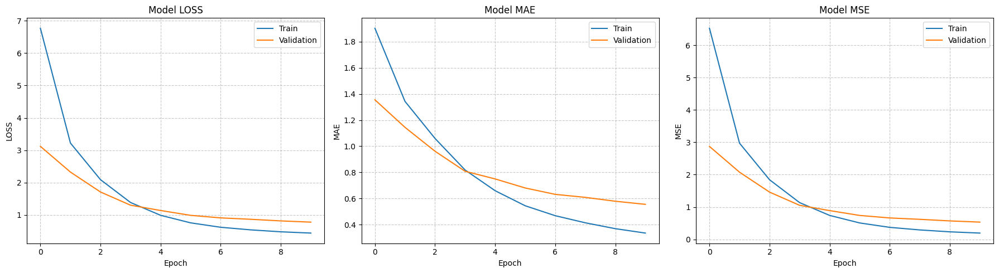


--- Final Test Set Evaluation (GW 16) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Evaluating test set performance...{'loss': 0.7613825798034668, 'mae': 0.5412636995315552, 'mse': 0.5201522707939148}
R²: 0.8539355133948653
MAE: 0.5412636995315552
MSE: 0.5201522707939148
Loss: 0.7613825798034668

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 16 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       16         Foden       11.9         11.92       0.78     -0.81
       16        Wilson        8.8          8.93       0.83     -0.69
       16   B.Fernandes        9.6          8.90       0.76     -0.82
       16        Rogers        8.2          8.05       0.72     -0.59
       16          Saka        7.0          7.10       1.96     -2.76
       16      Chalobah        7.2          7.06       1.15     -1.14
       16        Romero        5.0          6.68       0.02      0.22
       1

In [62]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 16)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_16 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_16.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_16 = model_16.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 16) ---")
test_result_16 = model_16.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_16, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_16}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_16 = model_16.predict([X_test_scaled, M_test_scaled]).flatten()


position_16 = active_data['position'][test_mask]
teams_16 = active_data['team'][test_mask]

players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_16, 'team': teams_16, 'position': position_16}
preds_df_16 = pd.DataFrame(players_preds)

# Results
results_df_16 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_16,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 16 ---")
print(results_df_16.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


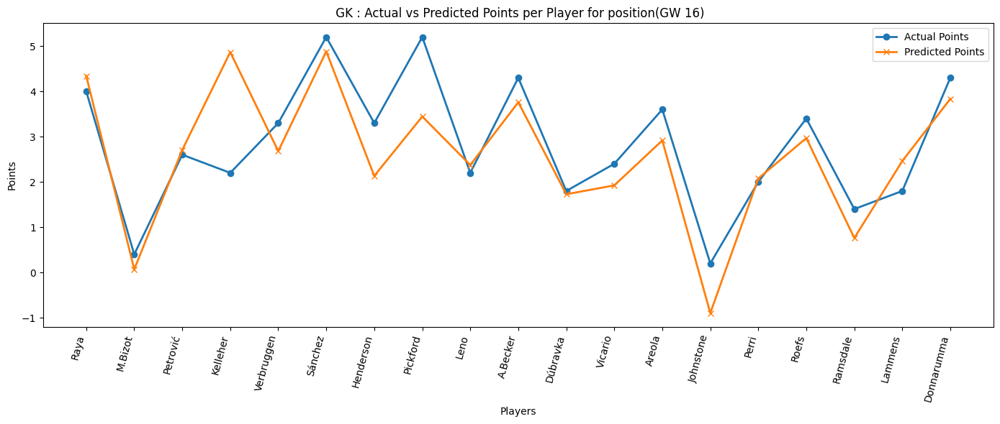

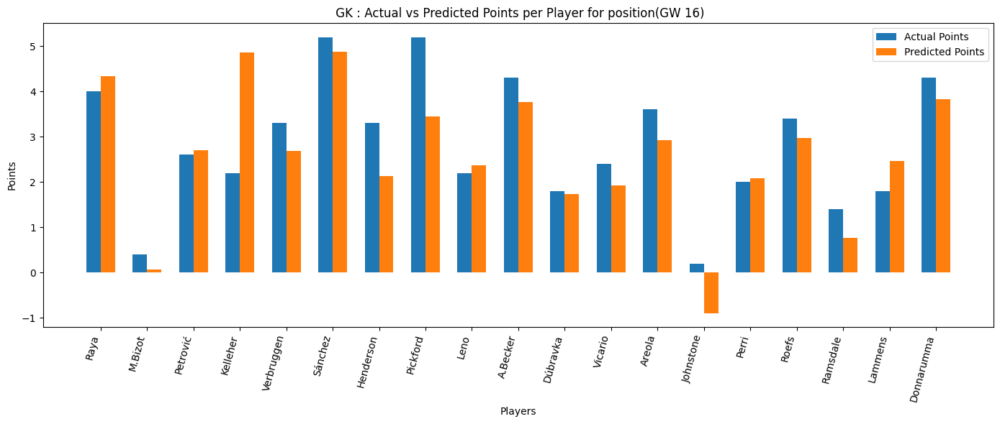

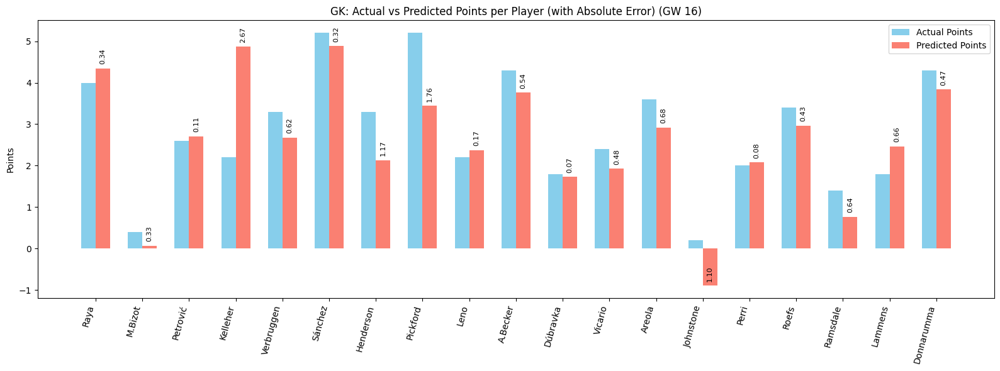

In [63]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


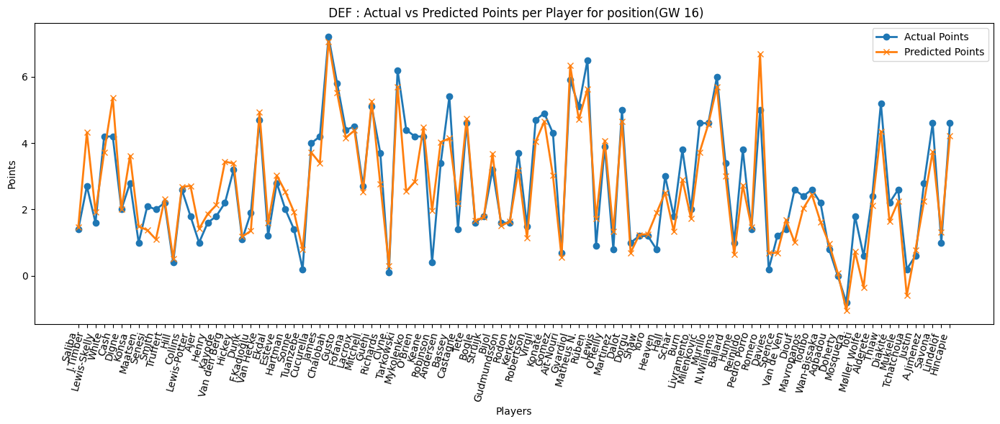

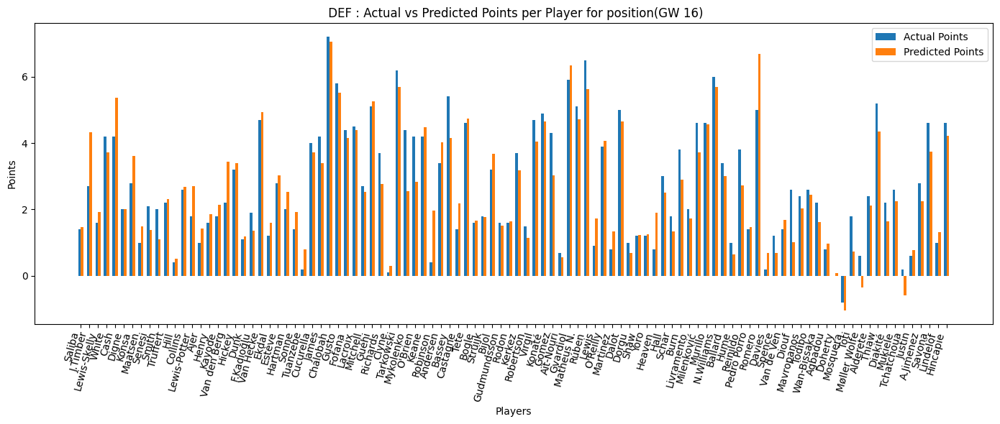

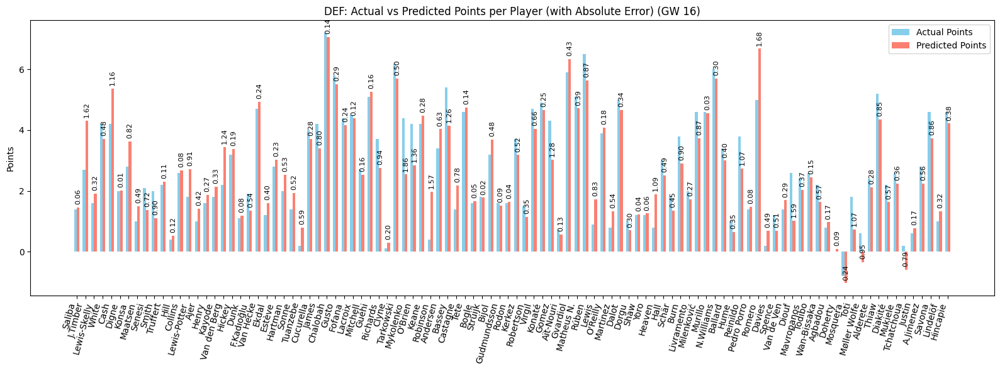

In [64]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


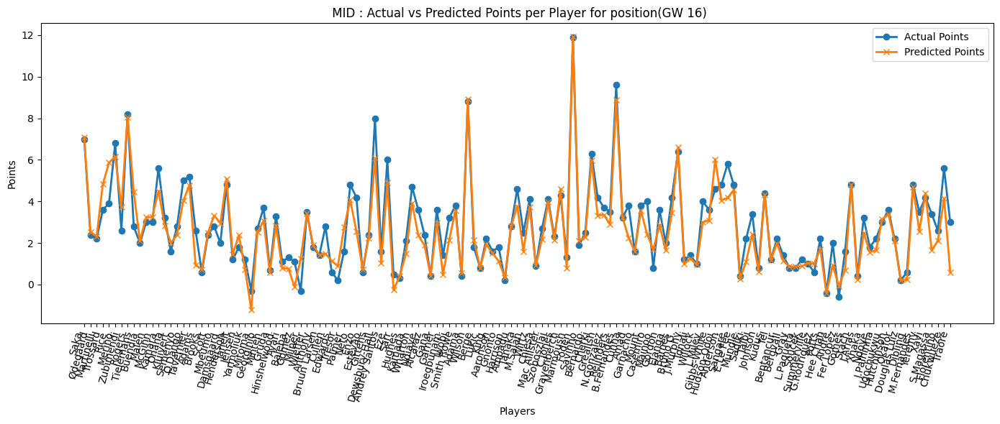

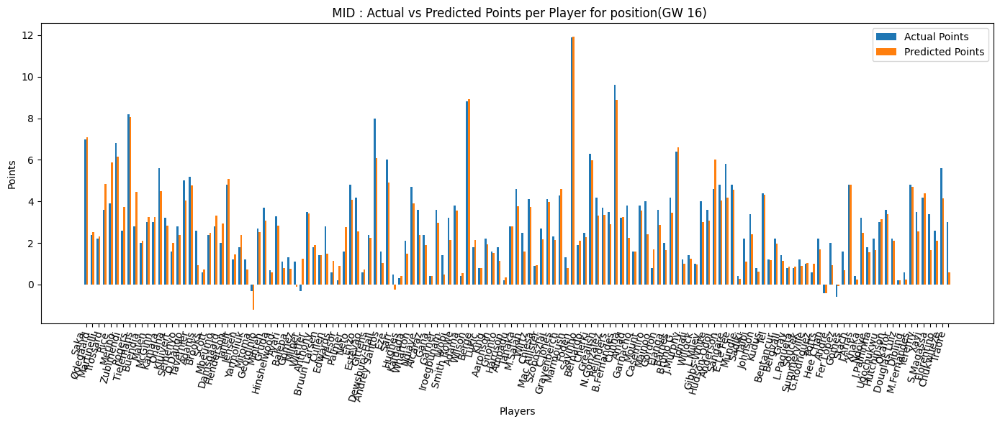

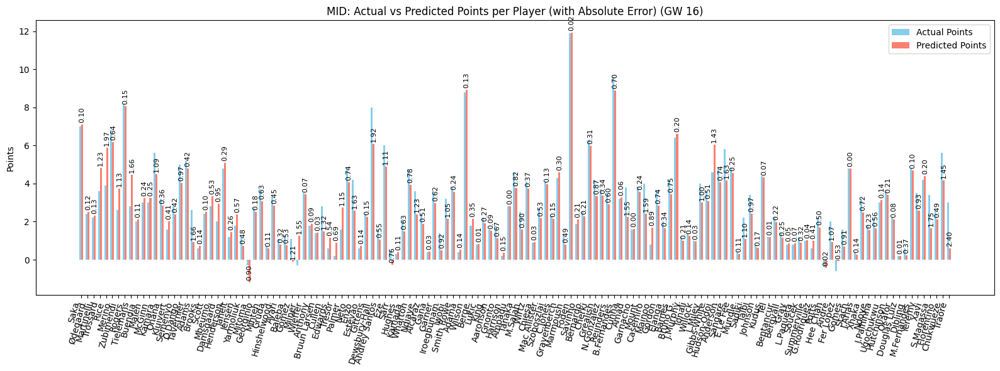

In [65]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


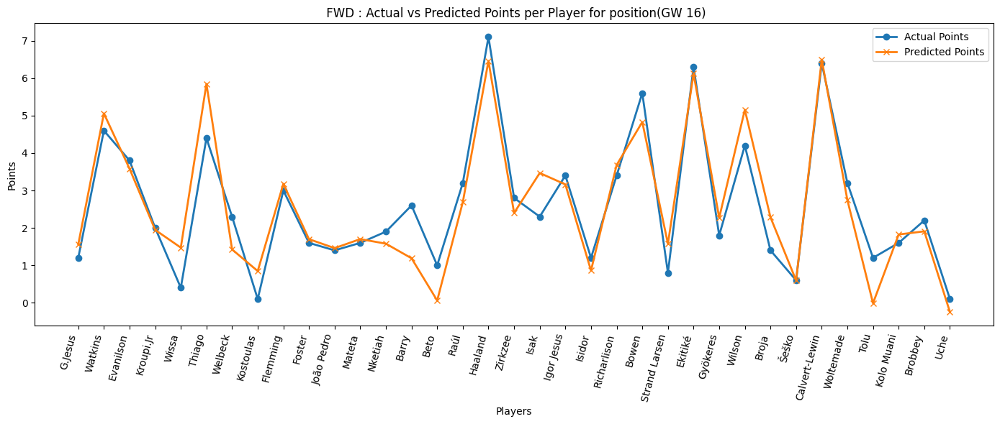

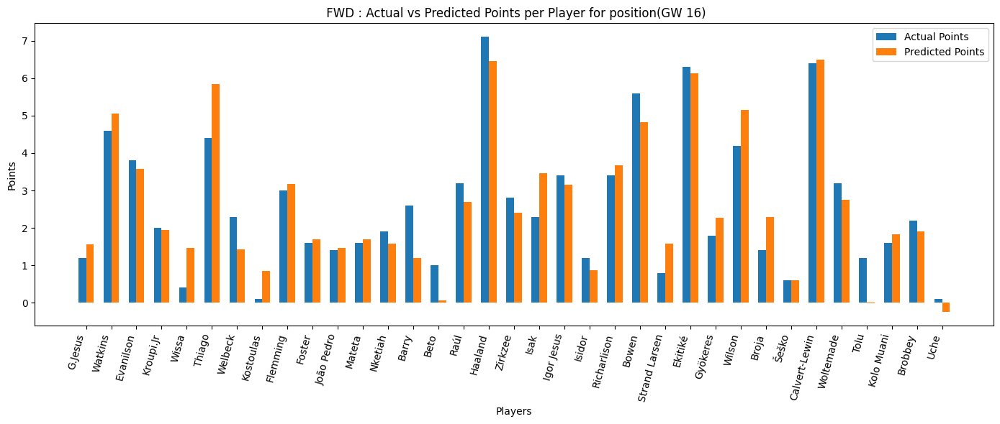

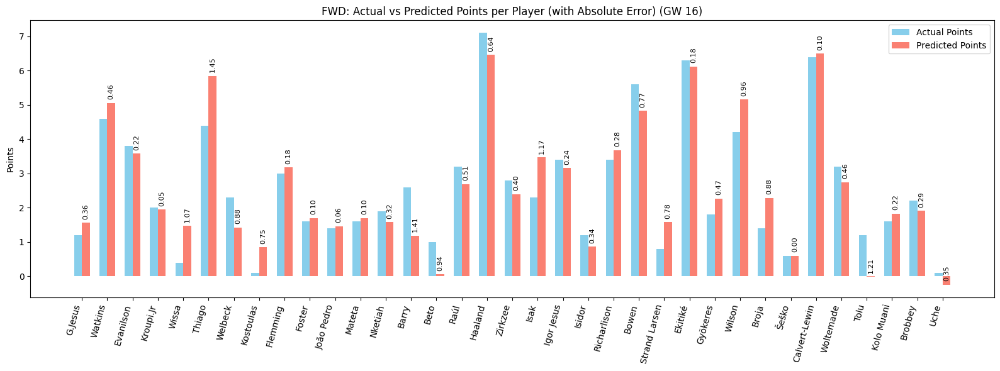

In [66]:
plot_preds(preds_df_16, 'FWD', 16)

#### Optimize


In [67]:
squad_16, total_points_16 = get_optimized_team(Y_pred_16, 16)
squad_16

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-275.8953


IRL epoch 100/200 loss=-2954.7900
IRL epoch 150/200 loss=-12479.3896
IRL epoch 200/200 loss=-34041.1953
HGAT Policy Embeddings Shape: torch.Size([297, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name         team position  price    xP_pred  is_captain  \
5             Saka      Arsenal      MID   10.2   7.104980       False   
181    B.Fernandes      Man Utd      MID    9.2   8.900834       False   
167          Foden     Man City      MID    8.7  11.918958        True   
18          Rogers  Aston Villa      MID    7.0   8.045236       False   
132         Wilson       Fulham      MID    5.4   8.930884       False   
84         Sánchez      Chelsea       GK    4.9   4.882651       False   
174        Haaland     Man City      FWD   15.0   6.459052       False   
271  Calvert-Lewin        Leeds      FWD    5.6   6.495872       False   
161       Gvardiol     Man City      DEF    5.9   6.332405       False   
87        Chalobah      Chelsea      DEF    5.4   7.0647

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Saka,Arsenal,MID,7.104980,11.0,False,True
1,Rogers,Aston Villa,MID,8.045236,15.0,False,False
2,Sánchez,Chelsea,GK,4.882651,6.0,False,False
3,Chalobah,Chelsea,DEF,7.064754,9.0,False,False
4,Wilson,Fulham,MID,8.930884,24.0,False,False
5,Gvardiol,Man City,DEF,6.332405,8.0,False,False
6,Foden,Man City,MID,11.918958,22.0,True,False
7,Haaland,Man City,FWD,6.459052,13.0,False,False
8,B.Fernandes,Man Utd,MID,8.900834,13.0,False,False
9,Romero,Spurs,DEF,6.679626,1.0,False,False


### GW 17


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 10.3814 - mae: 2.4660 - mse: 10.1378 - val_loss: 3.2416 - val_mae: 1.3791 - val_mse: 2.9978
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4452 - mae: 1.4156 - mse: 3.2015 - val_loss: 2.4049 - val_mae: 1.1773 - val_mse: 2.1613
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1226 - mae: 1.0808 - mse: 1.8790 - val_loss: 1.7625 - val_mae: 0.9834 - val_mse: 1.5190
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5869 - mae: 0.8982 - mse: 1.3434 - val_loss: 1.3560 - val_mae: 0.8241 - val_mse: 1.1127
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0876 - mae: 0.7082 - mse: 0.8443 - val_loss: 1.1134 - val_mae: 0.7229 - val_mse: 0.8703
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8386 - mae: 0.5913 - mse: 0.5956 - val_loss: 0.9482 - val_mae: 0.6489 - val_mse: 0.7056
Epoch 7/10
8

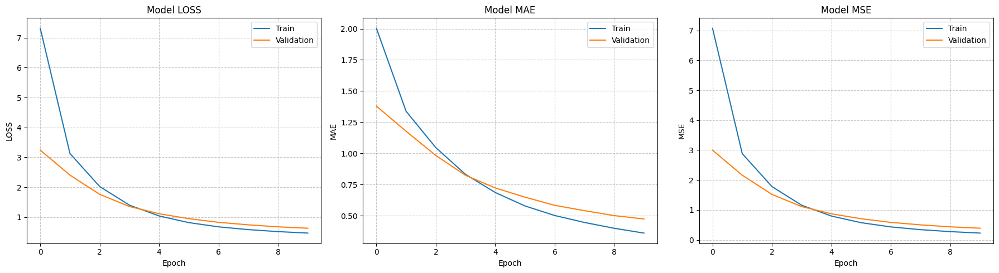


--- Final Test Set Evaluation (GW 17) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Evaluating test set performance...{'loss': 0.7124971151351929, 'mae': 0.5012497901916504, 'mse': 0.4728354513645172}
R²: 0.87511832547944890
MAE: 0.50124979019165039
MSE: 0.47283545136451721
Loss: 0.71249711513519287

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 17 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       17         Foden       12.1         11.22       1.61     -2.32
       17       Ekitiké        7.9          8.18       0.60     -0.56
       17 Calvert-Lewin        8.8          7.98       0.18      0.06
       17       Haaland        9.9          7.76       1.61     -2.32
       17        Wilson        8.8          7.64       0.36     -0.10
       17        Rogers        8.2          7.62       0.52     -0.42
       17  Lewis-Potter        6.0          6.94       0.60     -0.50
    

In [68]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 17)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_17 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_17.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_17 = model_17.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 17) ---")
test_result_17 = model_17.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_17, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_17}")
print(f"R²: {evaluation_metrics['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics['test_loss']:.17f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_17 = model_17.predict([X_test_scaled, M_test_scaled]).flatten()


position_17 = active_data['position'][test_mask]
teams_17 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_17, 'team': teams_17, 'position': position_17}
preds_df_17 = pd.DataFrame(players_preds)

# Results
results_df_17 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_17,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 17 ---")
print(results_df_17.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


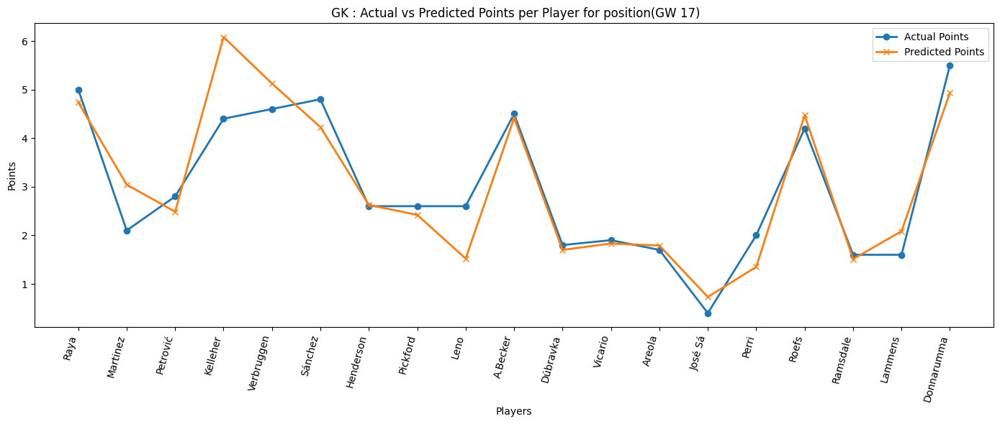

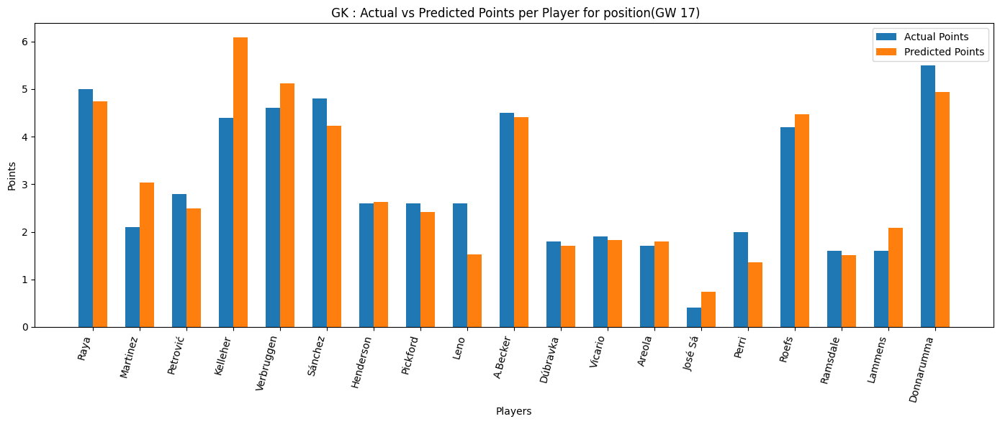

Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x7ca2e8723880>
Traceback (most recent call last):
  File "/usr/lib/python3.12/weakref.py", line 369, in remove
    def remove(k, selfref=ref(self)):

KeyboardInterrupt: 
Exception ignored in: <function _xla_gc_callback at 0x7ca2e331b060>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 


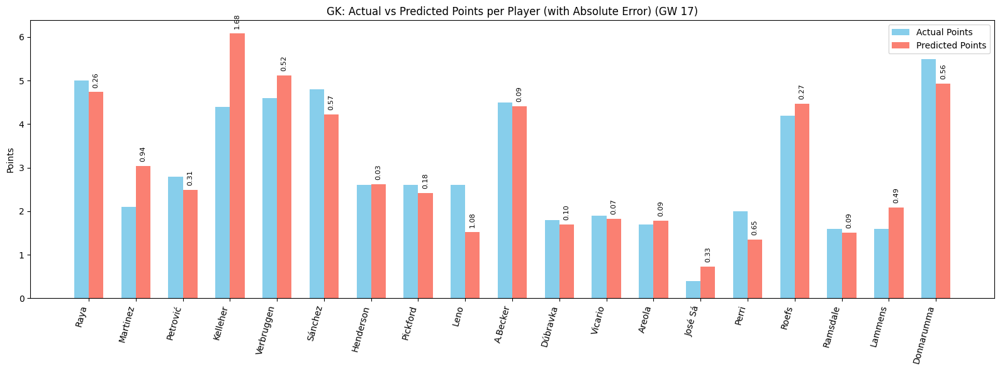

In [69]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


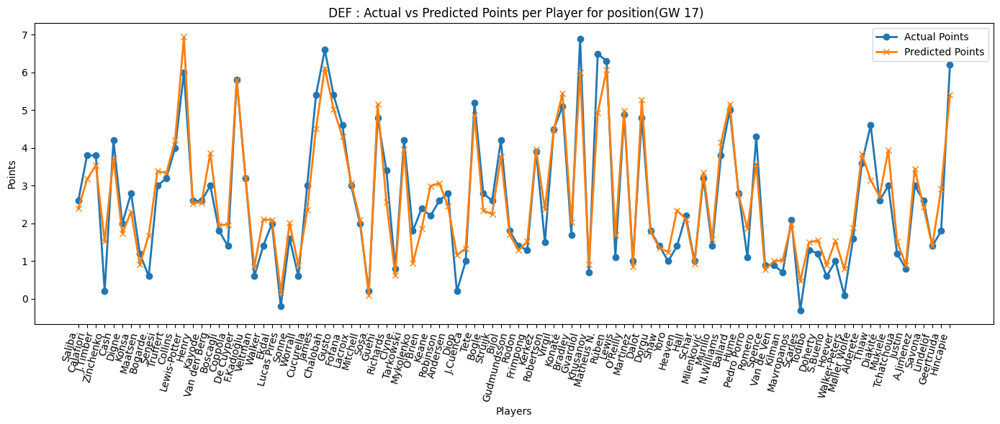

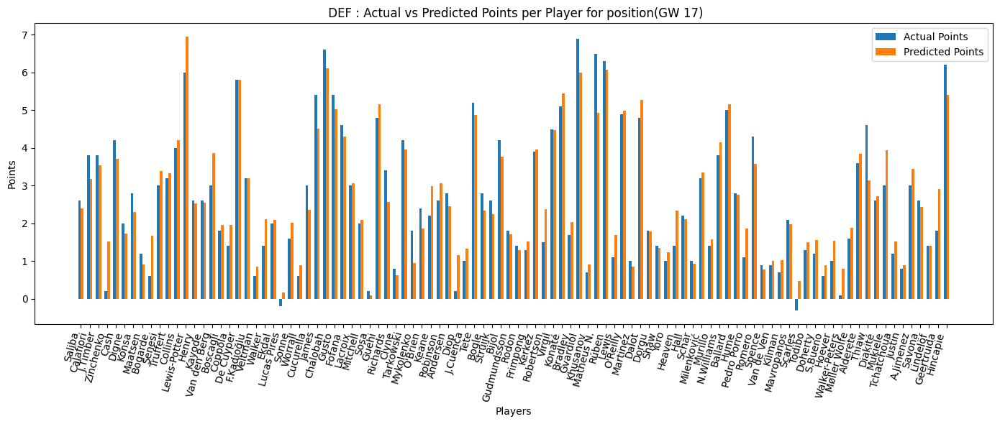

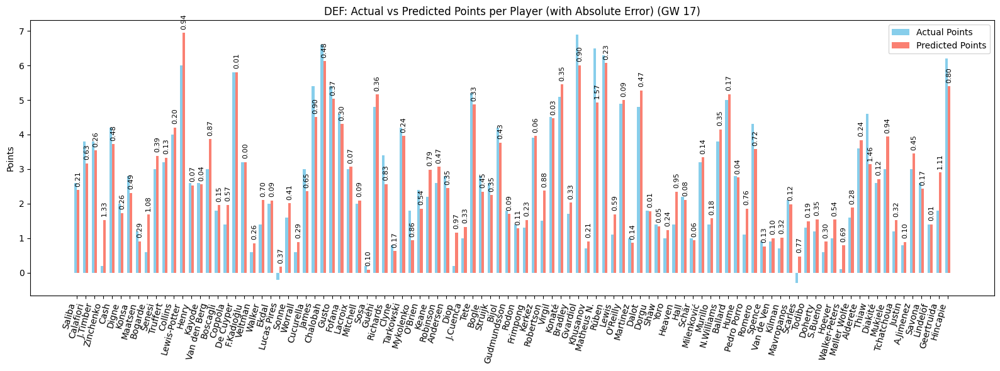

In [70]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


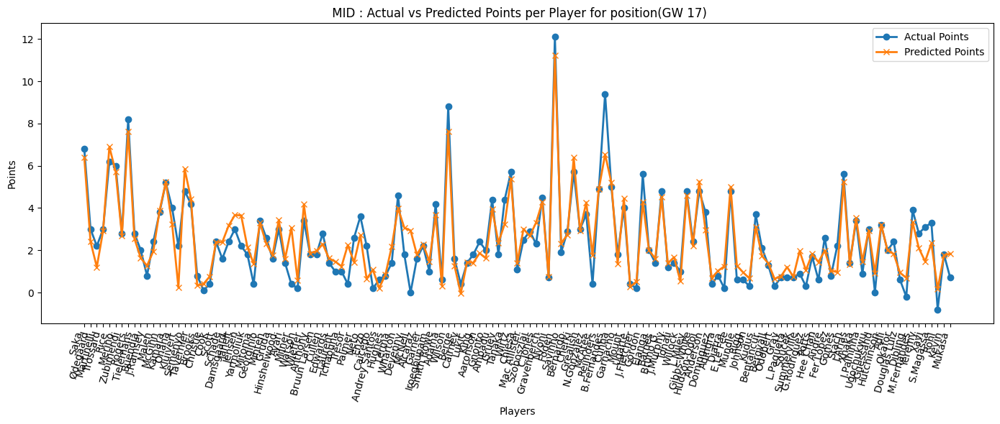

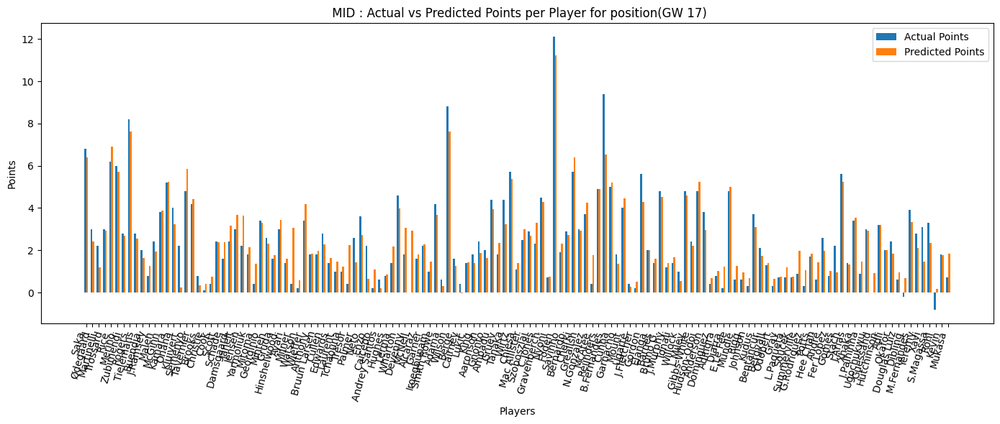

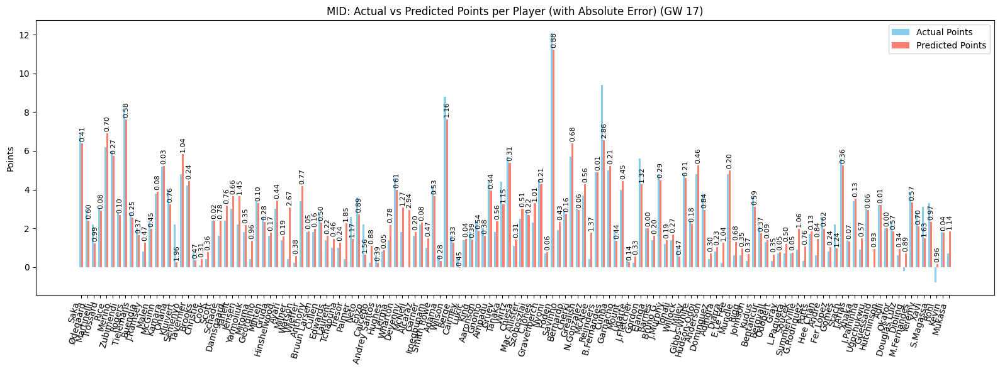

In [71]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


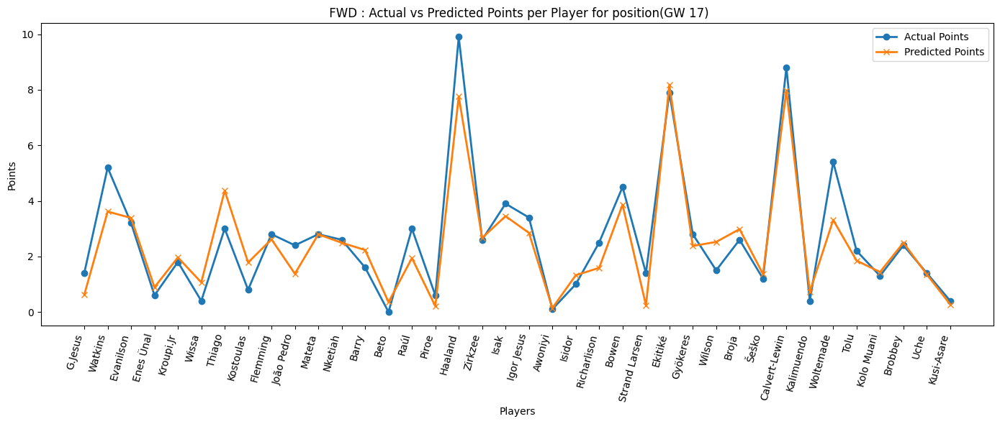

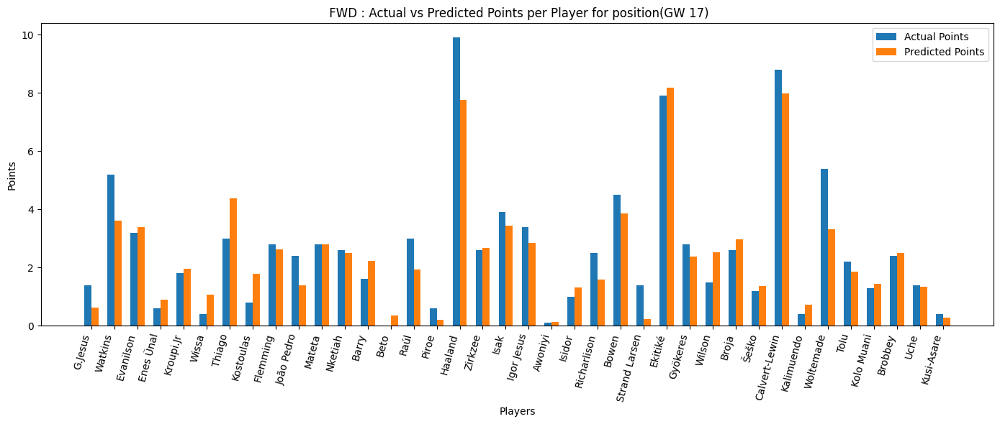

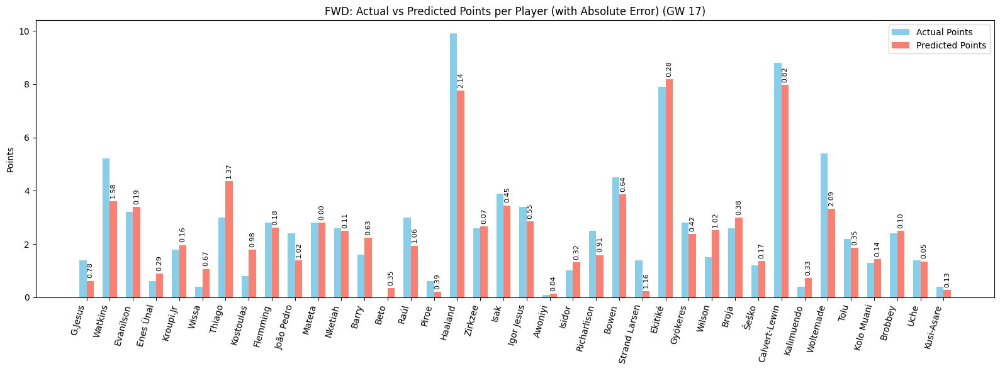

In [72]:
plot_preds(preds_df_17, 'FWD', 17)

#### Optimize


In [73]:
squad_17, total_points_17 = get_optimized_team(Y_pred_17, 17)
squad_17

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-301.1331
IRL epoch 100/200 loss=-3161.3455


IRL epoch 150/200 loss=-13342.0938
IRL epoch 200/200 loss=-36426.9414
HGAT Policy Embeddings Shape: torch.Size([296, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name         team position  price    xP_pred  is_captain  \
164          Foden     Man City      MID    8.9  11.216073        True   
9             Rice      Arsenal      MID    7.1   6.897931       False   
19          Rogers  Aston Villa      MID    7.1   7.618844       False   
127         Wilson       Fulham      MID    5.7   7.637173       False   
41        Kelleher    Brentford       GK    4.5   6.080959       False   
172        Haaland     Man City      FWD   15.0   7.757900       False   
249        Ekitiké    Liverpool      FWD    8.7   8.178032       False   
266  Calvert-Lewin        Leeds      FWD    5.7   7.976587       False   
161          Rúben     Man City      DEF    5.7   6.066103       False   
86        Chalobah      Chelsea      DEF    5.5   6.119898       False   
43    Lewis-Pott

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Rice,Arsenal,MID,6.897931,11.0,False,True
1,Rogers,Aston Villa,MID,7.618844,15.0,False,False
2,Kelleher,Brentford,GK,6.080959,13.0,False,False
3,Lewis-Potter,Brentford,DEF,6.941871,21.0,False,False
4,Chalobah,Chelsea,DEF,6.119898,3.0,False,False
5,Wilson,Fulham,MID,7.637173,2.0,False,False
6,Rúben,Man City,DEF,6.066103,6.0,False,False
7,Foden,Man City,MID,11.216073,6.0,True,False
8,Haaland,Man City,FWD,7.757900,16.0,False,False
9,Ekitiké,Liverpool,FWD,8.178032,13.5,False,False


### GW 18


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 7.9412 - mae: 2.0995 - mse: 7.6984 - val_loss: 3.1001 - val_mae: 1.3678 - val_mse: 2.8570
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5065 - mae: 1.4055 - mse: 3.2635 - val_loss: 2.2683 - val_mae: 1.1311 - val_mse: 2.0253
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2241 - mae: 1.1167 - mse: 1.9811 - val_loss: 1.6066 - val_mae: 0.9219 - val_mse: 1.3636
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4267 - mae: 0.8552 - mse: 1.1837 - val_loss: 1.1686 - val_mae: 0.7472 - val_mse: 0.9257
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.9092 - mae: 0.6229 - mse: 0.6664 - val_loss: 0.9784 - val_mae: 0.6663 - val_mse: 0.7361
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7081 - mae: 0.5255 - mse: 0.4659 - val_loss: 0.8789 - val_mae: 0.6235 - val_mse: 0.6373
Epoch 7/10
84

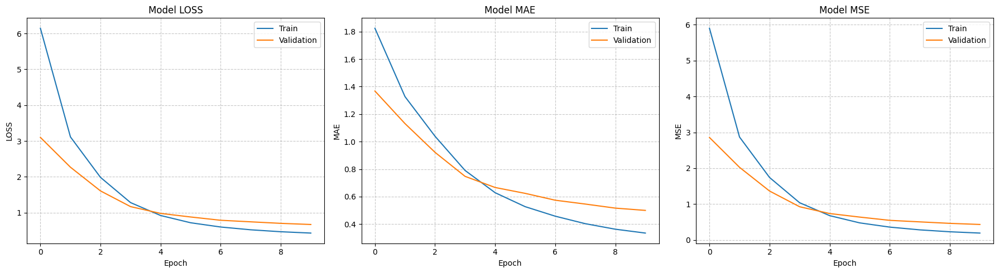


--- Final Test Set Evaluation (GW 18) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Evaluating test set performance...{'loss': 0.5953856110572815, 'mae': 0.4503565728664398, 'mse': 0.35747212171554565}
R²: 0.894182748476385347
MAE: 0.450356572866439819
MSE: 0.357472121715545654
Loss: 0.595385611057281494

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 18 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       18       Haaland        9.9          9.40       1.08     -1.23
       18 Calvert-Lewin        9.0          8.52       0.02      0.31
       18         Foden        9.5          7.82       1.08     -1.23
       18        Cherki        7.5          7.71       1.08     -1.23
       18        Rogers        7.0          7.41      -0.81      0.81
       18       Ekitiké        7.5          7.40       1.62     -2.18
       18        Wilson        5.8          7.37       0.10      0.08

In [74]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 18)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_18 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_18.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_18 = model_18.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 18) ---")
test_result_18 = model_18.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_18, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_18}")
print(f"R²: {evaluation_metrics['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics['test_loss']:.18f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_18 = model_18.predict([X_test_scaled, M_test_scaled]).flatten()


position_18 = active_data['position'][test_mask]
teams_18 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_18, 'team': teams_18, 'position': position_18}
preds_df_18 = pd.DataFrame(players_preds)

# Results
results_df_18 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_18,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 18 ---")
print(results_df_18.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


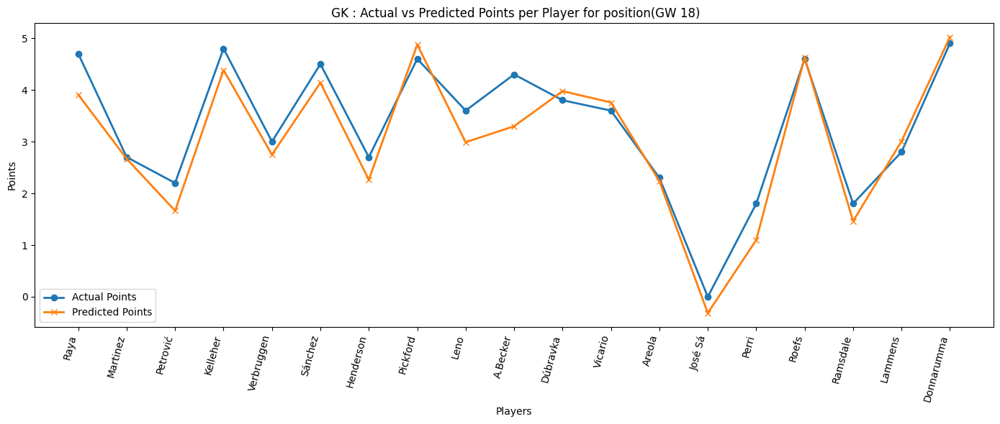

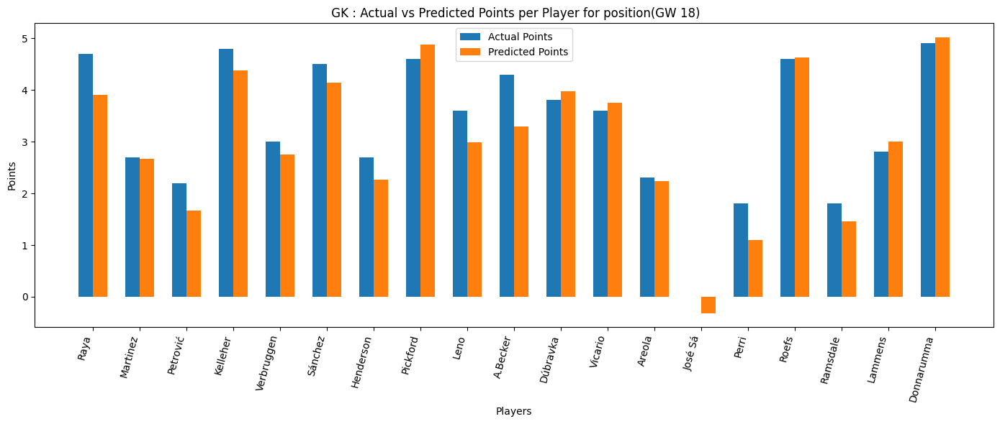

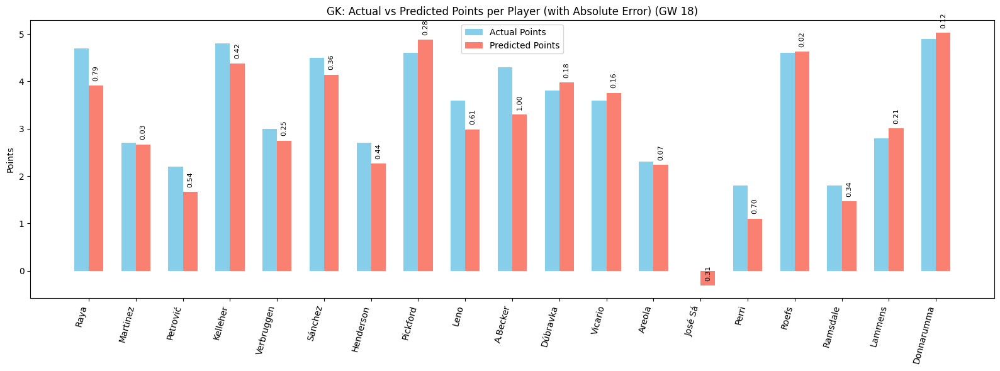

In [75]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


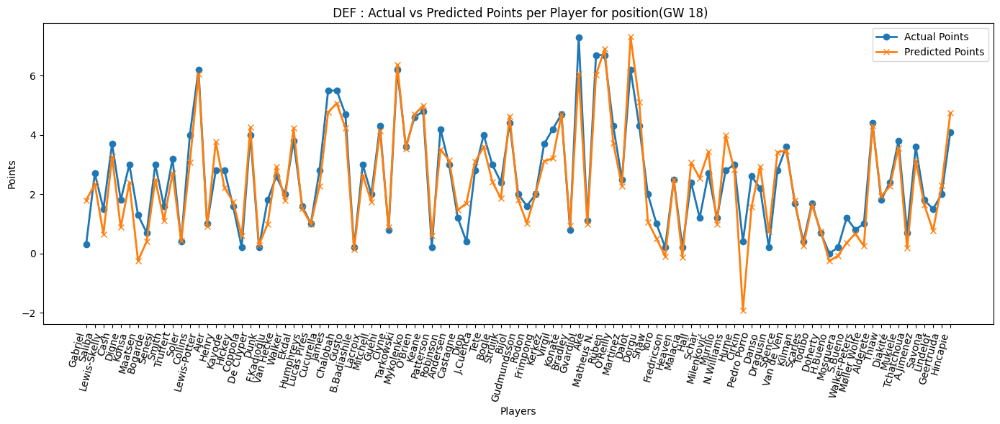

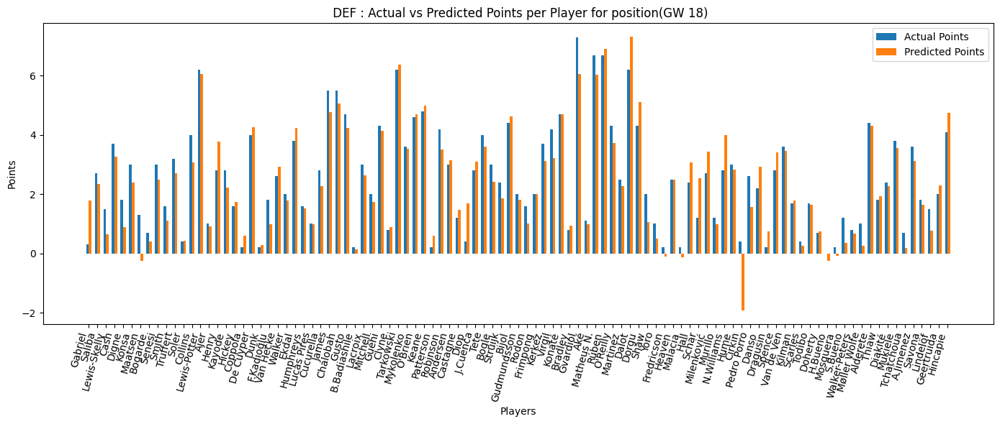

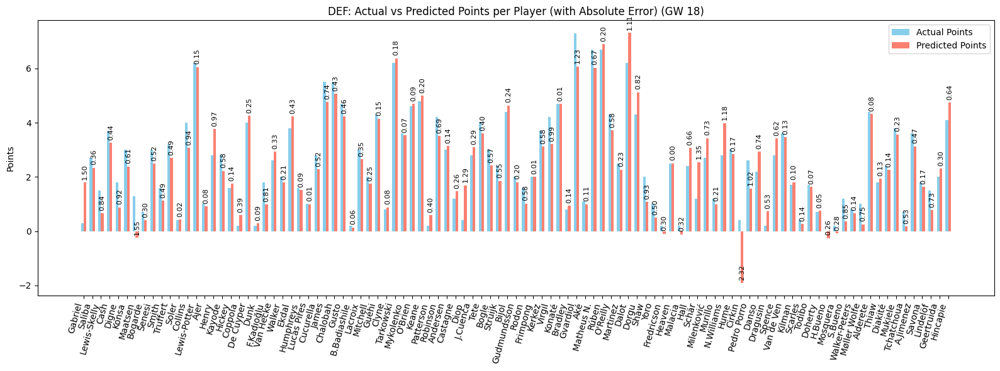

In [76]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


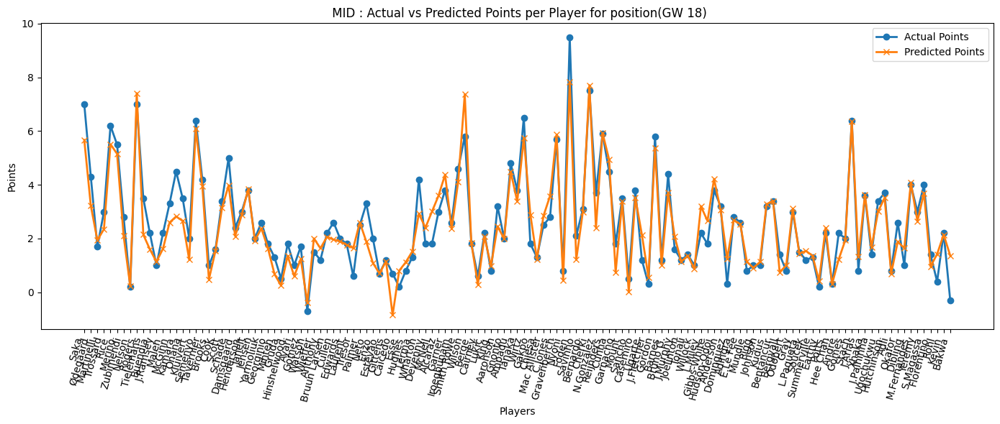

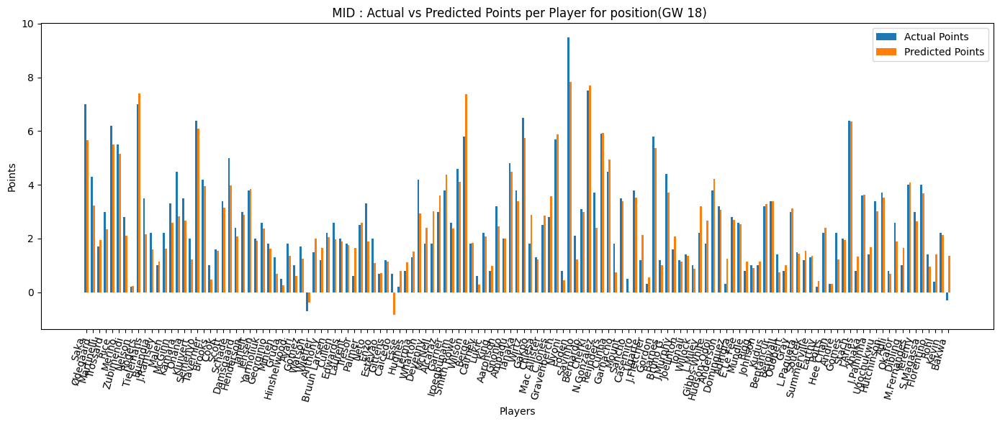

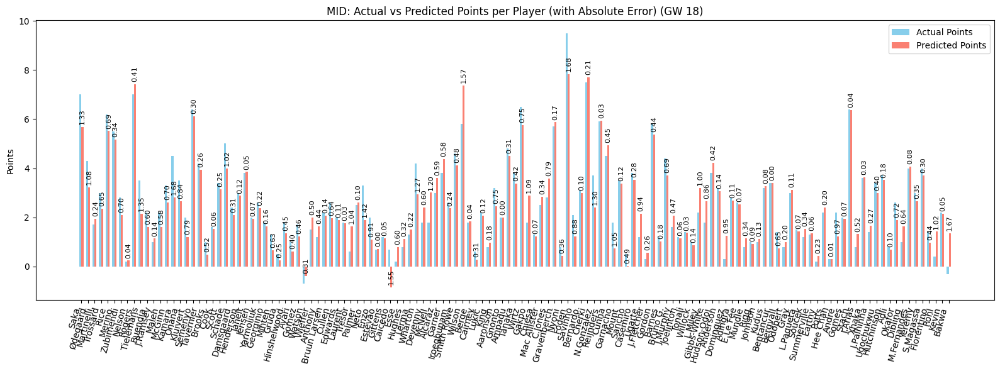

In [77]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


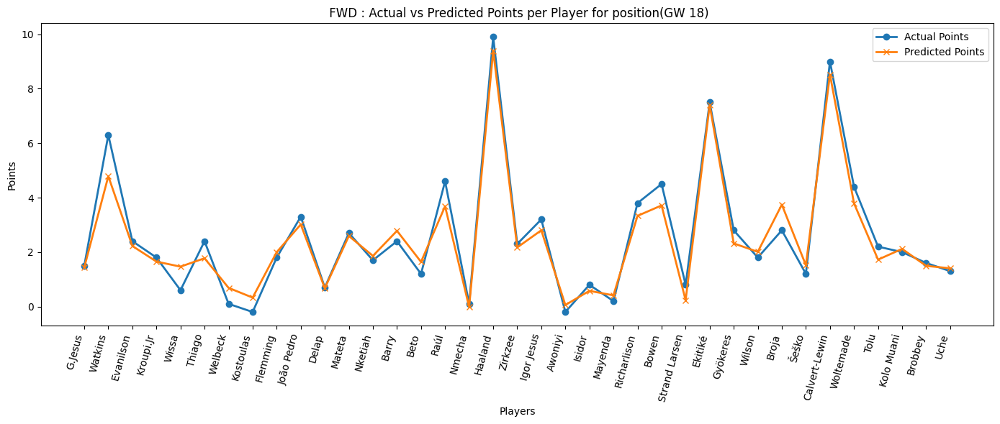

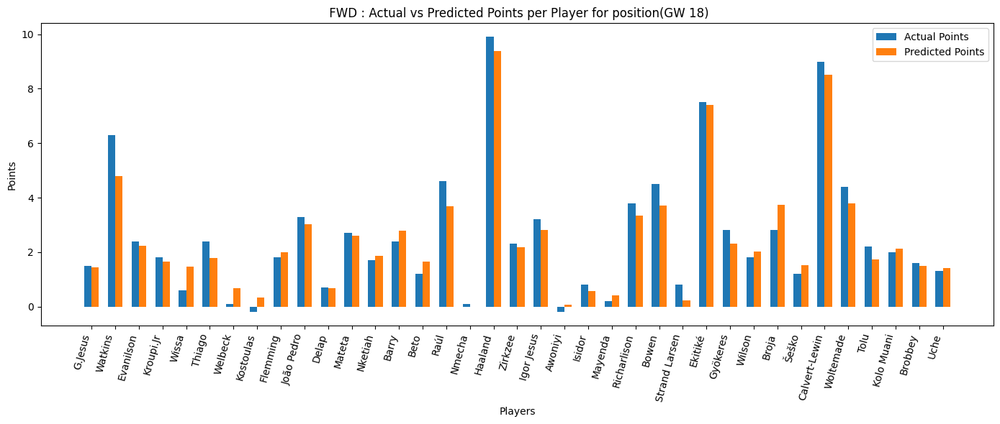

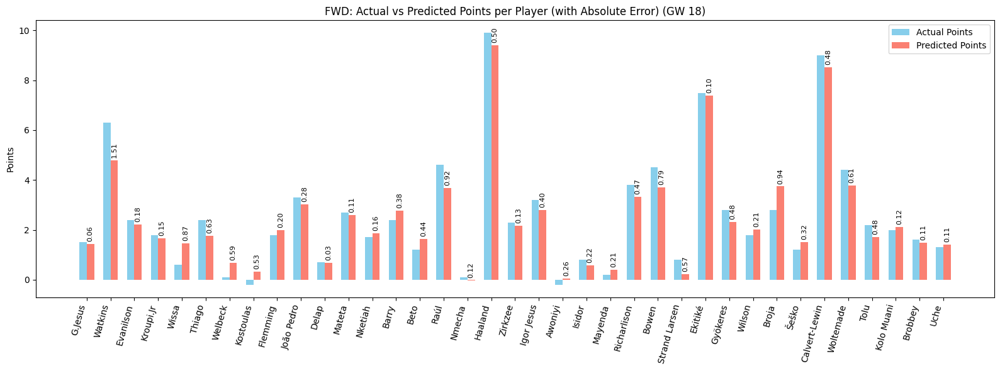

In [78]:
plot_preds(preds_df_18, 'FWD', 18)

#### Optimize


In [79]:
squad_18, total_points_18 = get_optimized_team(Y_pred_18, 18)
squad_18

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-181.1158
IRL epoch 100/200 loss=-2050.0872
IRL epoch 150/200 loss=-8833.9912
IRL epoch 200/200 loss=-24308.3027
HGAT Policy Embeddings Shape: torch.Size([290, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name         team position  price   xP_pred  is_captain  is_vice
163          Foden     Man City      MID    9.0  7.818770       False    False
19          Rogers  Aston Villa      MID    7.3  7.411474       False    False
166         Cherki     Man City      MID    6.6  7.709549       False     True
129         Wilson       Fulham      MID    5.8  7.370684       False    False
109       Pickford      Everton       GK    5.5  4.875240       False    False
169        Haaland     Man City      FWD   15.1  9.397434        True    False
248        Ekitiké    Liverpool      FWD    9.0  7.396040       False    False
264  Calvert-Lewin        Leeds      FWD    5.8  8.521152       False    False
110      

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Rogers,Aston Villa,MID,7.411474,1.0,False,False
1,Lewis-Potter,Brentford,DEF,6.050735,2.0,False,False
2,Pickford,Everton,GK,4.875240,6.0,False,False
3,Tarkowski,Everton,DEF,6.377234,8.0,False,False
4,Wilson,Fulham,MID,7.370684,5.0,False,False
5,Foden,Man City,MID,7.818770,2.0,False,False
6,Cherki,Man City,MID,7.709549,13.0,False,True
7,Haaland,Man City,FWD,9.397434,4.0,True,False
8,Dalot,Man Utd,DEF,7.311542,13.0,False,False
9,Ekitiké,Liverpool,FWD,7.396040,5.0,False,False


### GW 19


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10


83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 12.5102 - mae: 2.7995 - mse: 12.2654 - val_loss: 3.3432 - val_mae: 1.4102 - val_mse: 3.0982
Epoch 2/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.6622 - mae: 1.4364 - mse: 3.4171 - val_loss: 2.3731 - val_mae: 1.1564 - val_mse: 2.1282
Epoch 3/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2065 - mae: 1.1173 - mse: 1.9616 - val_loss: 1.7335 - val_mae: 0.9492 - val_mse: 1.4886
Epoch 4/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4435 - mae: 0.8636 - mse: 1.1987 - val_loss: 1.3158 - val_mae: 0.7991 - val_mse: 1.0710
Epoch 5/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0204 - mae: 0.6797 - mse: 0.7756 - val_loss: 1.0493 - val_mae: 0.6920 - val_mse: 0.8048
Epoch 6/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7639 - mae: 0.5527 - mse: 0.5195 - val_loss: 0.9053 - val_mae: 0.6195 - val_mse: 0.6611
Epoch 7/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6213 - mae: 0.4658 - mse: 0.3773 - val_loss: 0.7860 - val_ma

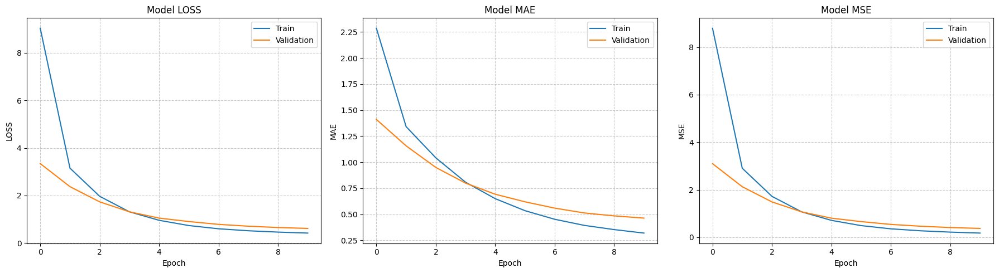


--- Final Test Set Evaluation (GW 19) ---

Evaluating test set performance...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Evaluating test set performance...{'loss': 0.5902876257896423, 'mae': 0.40883868932724, 'mse': 0.3489185571670532}
R²: 0.8991717333706835680
MAE: 0.4088386893272399902
MSE: 0.3489185571670532227
Loss: 0.5902876257896423340

Generating Predictions...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 19 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       19        Cherki        8.5         10.02       1.46     -1.75
       19       Ekitiké        8.9          7.87       1.18     -1.38
       19       Haaland        7.5          7.79       1.46     -1.75
       19    Matheus N.        8.5          7.56       1.46     -1.75
       19         Rúben        7.9          7.48       1.46     -1.75
       19 Calvert-Lewin        6.9          7.21      -1.39      1.18
       19         Dalot        6.2          7.20       1.50     -1.88
  

In [80]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 19)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_19 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_19.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_19 = model_19.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 19) ---")
test_result_19 = model_19.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_19, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_19}")
print(f"R²: {evaluation_metrics['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics['test_loss']:.19f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_19 = model_19.predict([X_test_scaled, M_test_scaled]).flatten()


position_19 = active_data['position'][test_mask]
teams_19 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_19, 'team': teams_19, 'position': position_19}
preds_df_19 = pd.DataFrame(players_preds)

# Results
results_df_19 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_19,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 19 ---")
print(results_df_19.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


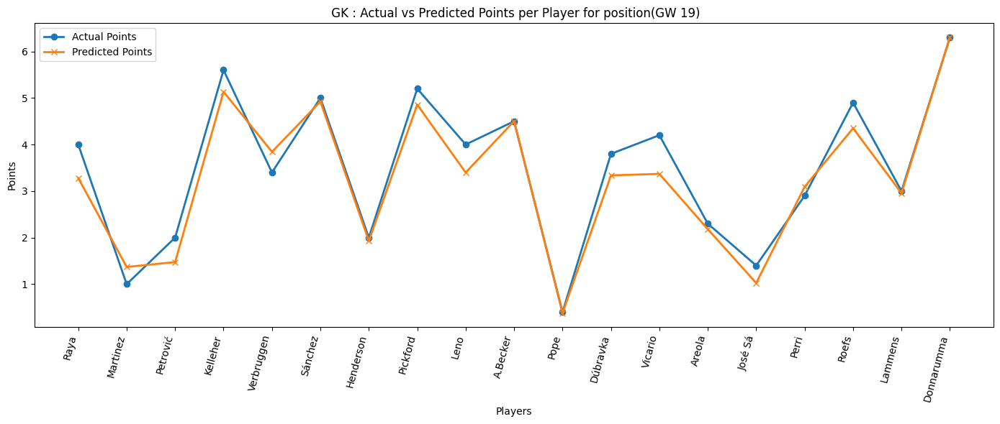

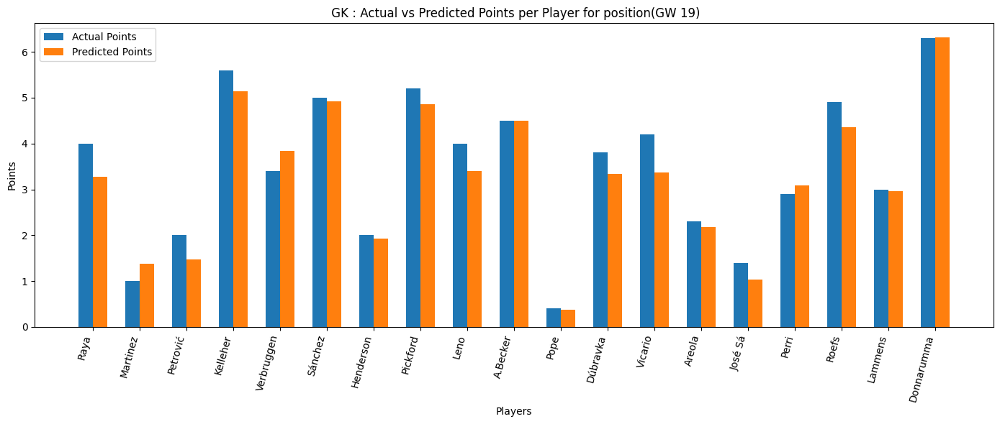

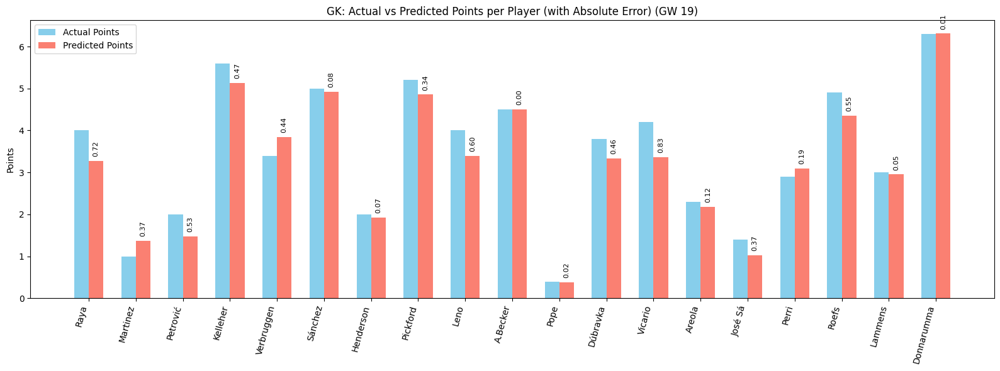

In [81]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


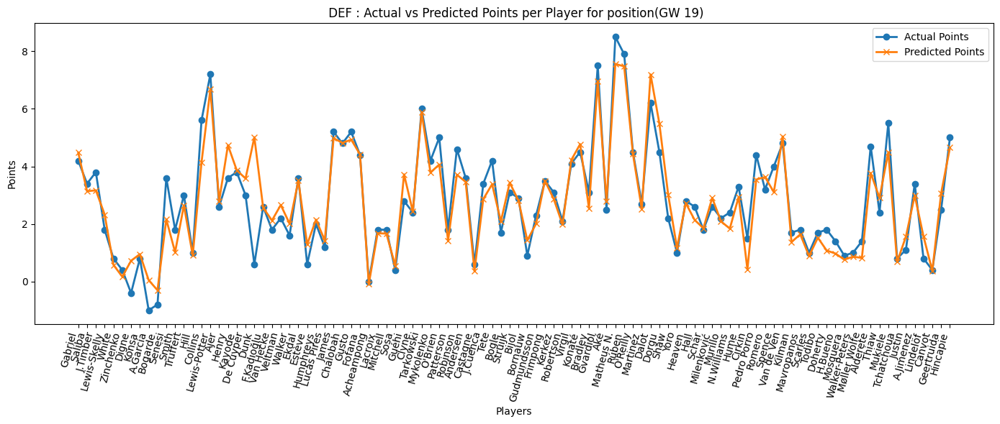

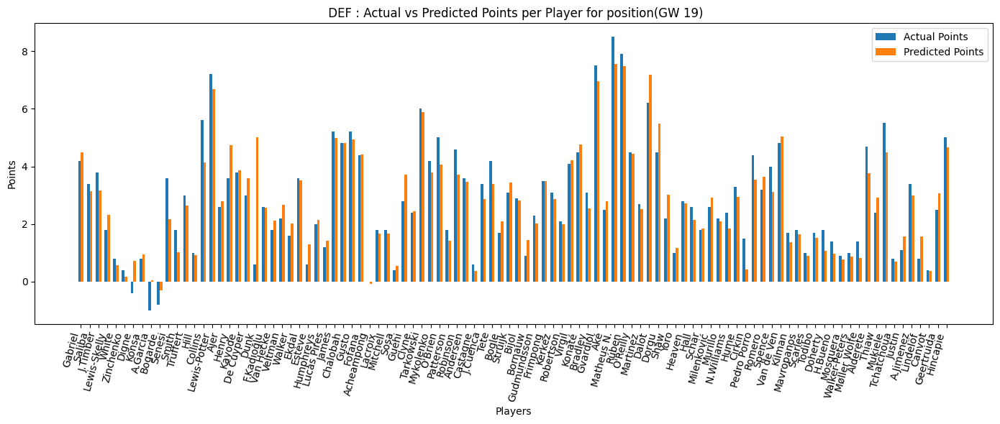

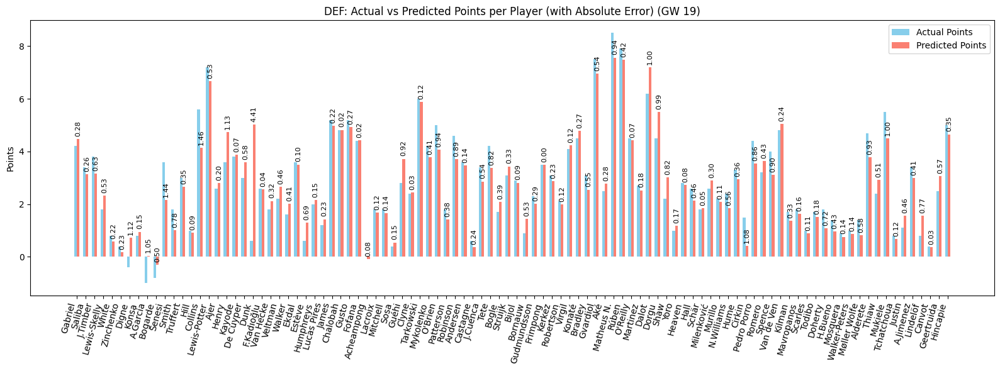

In [82]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


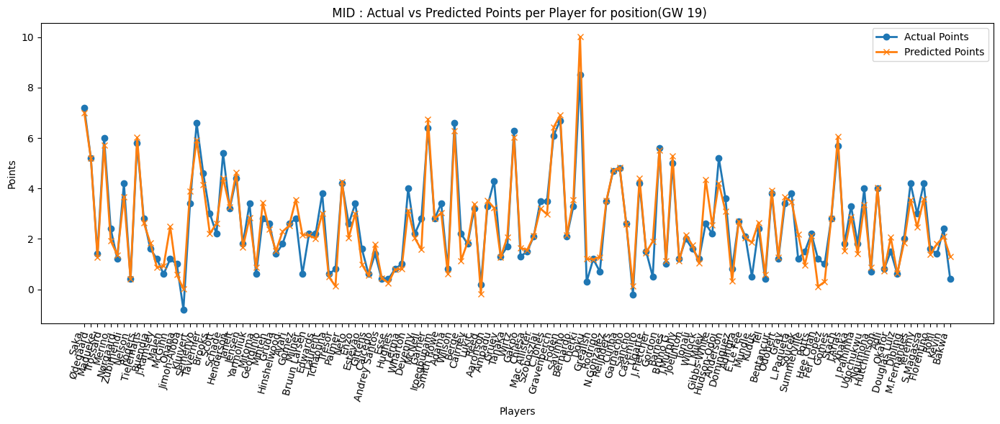

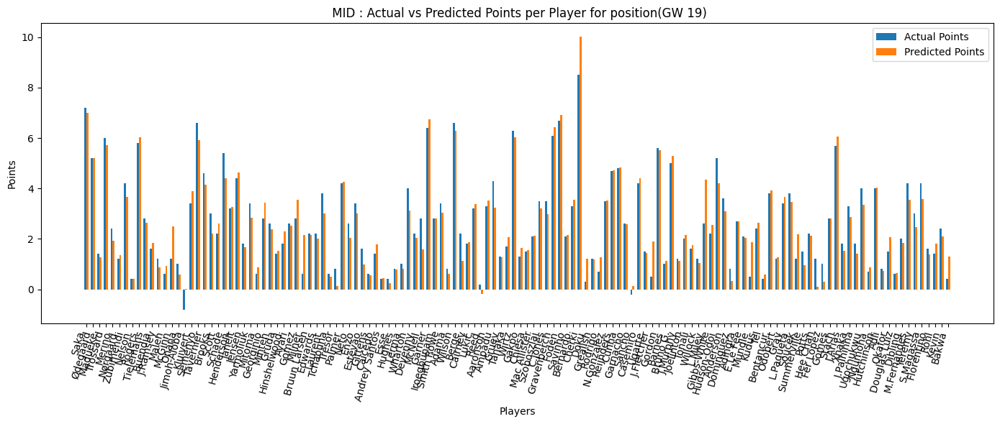

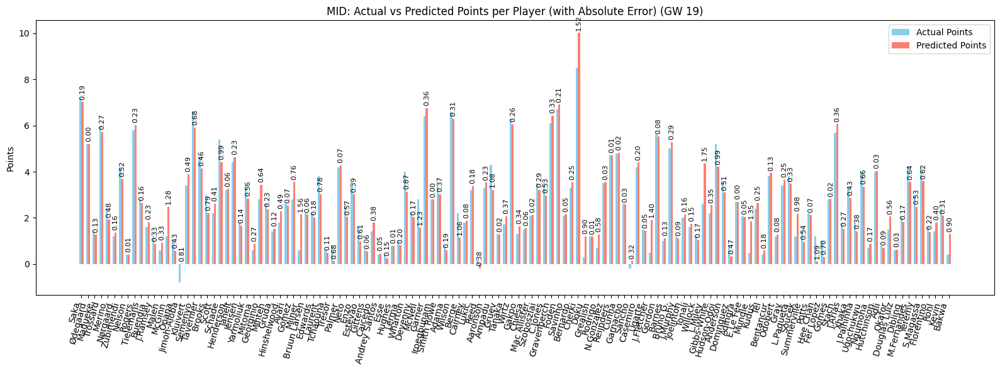

In [83]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


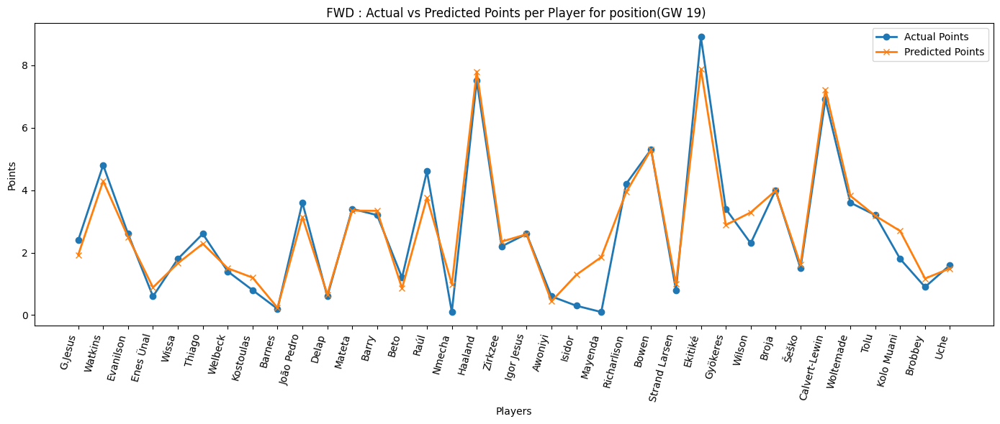

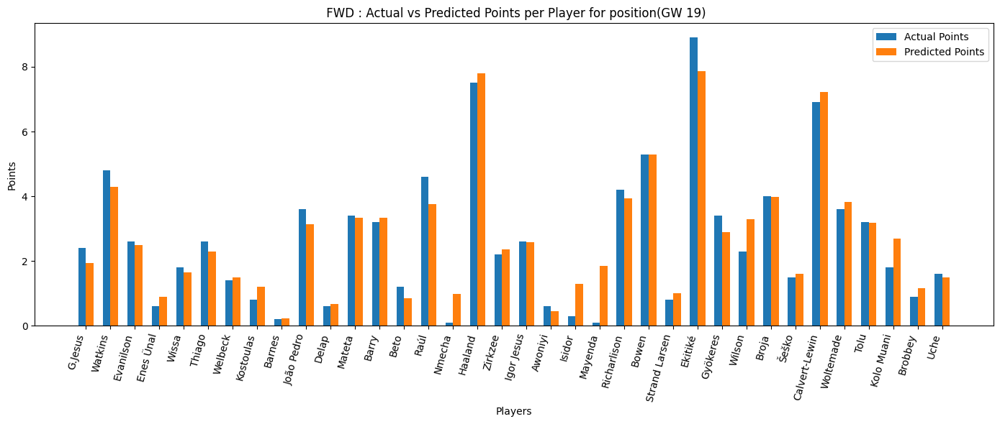

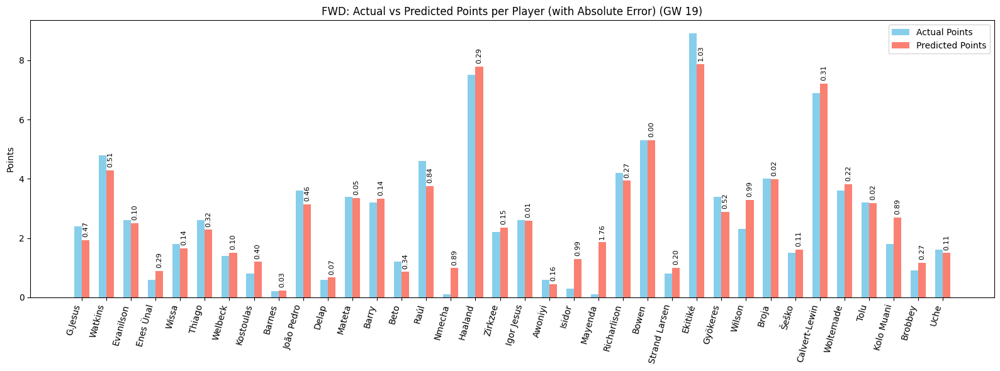

In [84]:
plot_preds(preds_df_19, 'FWD', 19)

#### Optimize


In [85]:
squad_19, total_points_19 = get_optimized_team(Y_pred_19, 19)
squad_19

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-247.3776
IRL epoch 100/200 loss=-2587.7332
IRL epoch 150/200 loss=-10856.9297
IRL epoch 200/200 loss=-29541.7383
HGAT Policy Embeddings Shape: torch.Size([287, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name       team position  price    xP_pred  is_captain  is_vice
7             Saka    Arsenal      MID   10.3   7.012432       False    False
165         Cherki   Man City      MID    6.7  10.015559        True    False
156    Gravenberch  Liverpool      MID    5.7   6.426651       False    False
115         Garner    Everton      MID    5.0   6.757552       False    False
42        Kelleher  Brentford       GK    4.5   5.134565       False    False
171        Haaland   Man City      FWD   15.1   7.791520       False    False
244        Ekitiké  Liverpool      FWD    9.1   7.871867       False    False
259  Calvert-Lewin      Leeds      FWD    5.8   7.214387       False    False
159     Matheus N

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Saka,Arsenal,MID,7.012432,6.0,False,False
1,Kelleher,Brentford,GK,5.134565,6.0,False,False
2,Lewis-Potter,Brentford,DEF,6.674396,6.0,False,True
3,Garner,Everton,MID,6.757552,16.0,False,False
4,Gravenberch,Liverpool,MID,6.426651,5.0,False,False
5,Matheus N.,Man City,DEF,7.559342,11.0,False,False
6,Cherki,Man City,MID,10.015559,10.0,True,False
7,Haaland,Man City,FWD,7.791520,2.0,False,False
8,Dalot,Man Utd,DEF,7.195209,2.0,False,False
9,Ekitiké,Liverpool,FWD,7.871867,3.0,False,False


### GW 20


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 8.5481 - mae: 2.2179 - mse: 8.3048 - val_loss: 2.9796 - val_mae: 1.3106 - val_mse: 2.7359
Epoch 2/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0211 - mae: 1.3042 - mse: 2.7775 - val_loss: 2.2040 - val_mae: 1.0946 - val_mse: 1.9604
Epoch 3/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0115 - mae: 1.0442 - mse: 1.7679 - val_loss: 1.5692 - val_mae: 0.9112 - val_mse: 1.3257
Epoch 4/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.3385 - mae: 0.8090 - mse: 1.0950 - val_loss: 1.1774 - val_mae: 0.7613 - val_mse: 0.9340
Epoch 5/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.9227 - mae: 0.6283 - mse: 0.6794 - val_loss: 0.9740 - val_mae: 0.6566 - val_mse: 0.7310
Epoch 6/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.7104 - mae: 0.5232 - mse: 0.4675 - val_loss: 0.8151 - val_mae: 0.5813 - val_mse: 0.5725
Epoch 7/10
83/

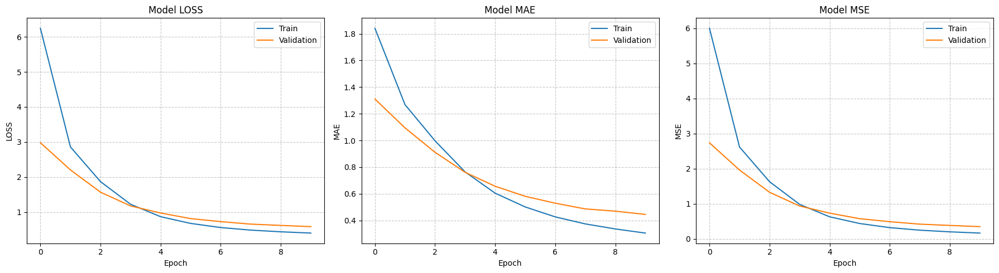


--- Final Test Set Evaluation (GW 20) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Evaluating test set performance...{'loss': 0.5598496794700623, 'mae': 0.4074547588825226, 'mse': 0.3206448554992676}
R²: 0.88903226589352413178
MAE: 0.40745475888252258301
MSE: 0.32064485549926757812
Loss: 0.55984967947006225586

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 20 ---
 Gameweek     Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       20     Cherki        7.8          7.76       0.94     -1.19
       20       Rice        3.9          7.47       1.31     -1.56
       20    Haaland        6.7          6.94       0.94     -1.19
       20      Wirtz        7.0          6.92       0.72     -0.66
       20     Rogers        6.5          6.85       0.93     -0.93
       20      Rúben        7.5          6.71       0.94     -1.19
       20       Saka        6.8          6.40       1.31     -1.56
       20 Matheu

In [86]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 20)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_20 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_20.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_20 = model_20.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 20) ---")
test_result_20 = model_20.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_20, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_20}")
print(f"R²: {evaluation_metrics['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics['test_loss']:.20f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_20 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_20 = active_data['position'][test_mask]
teams_20 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_20, 'team': teams_20, 'position': position_20}
preds_df_20 = pd.DataFrame(players_preds)

# Results
results_df_20 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_20,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 20 ---")
print(results_df_20.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


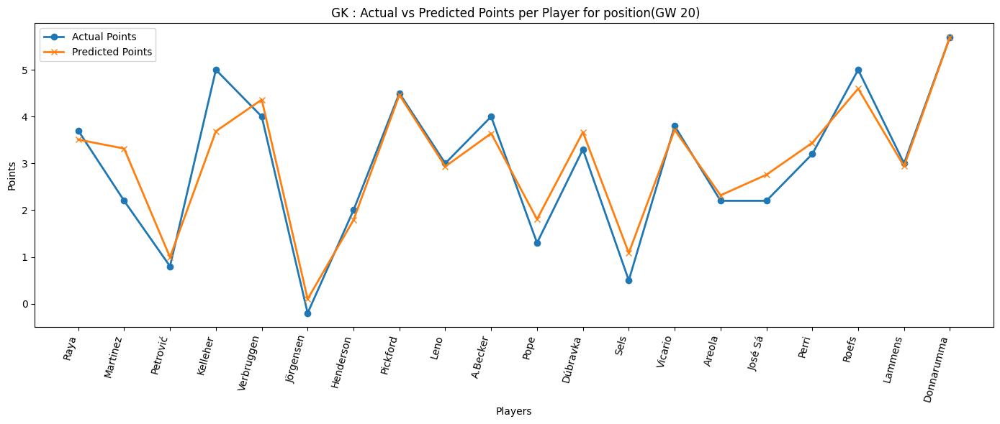

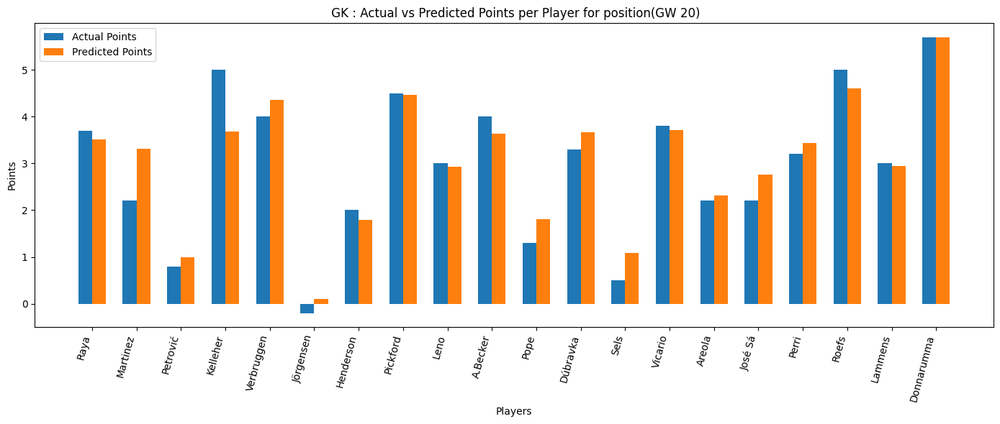

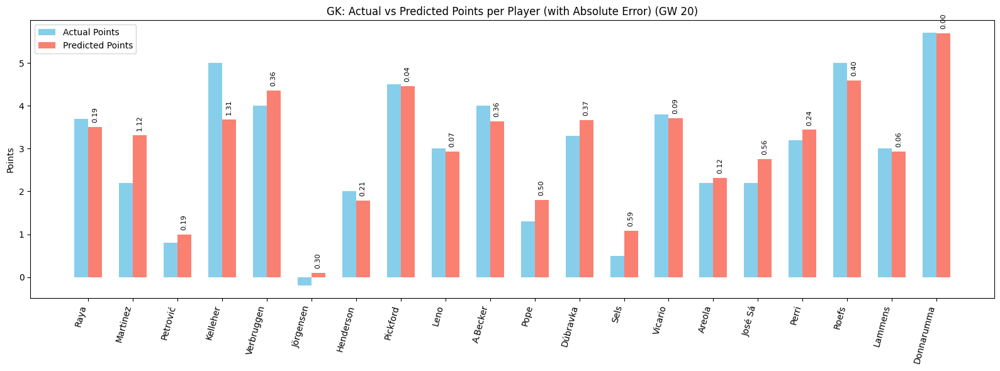

In [87]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


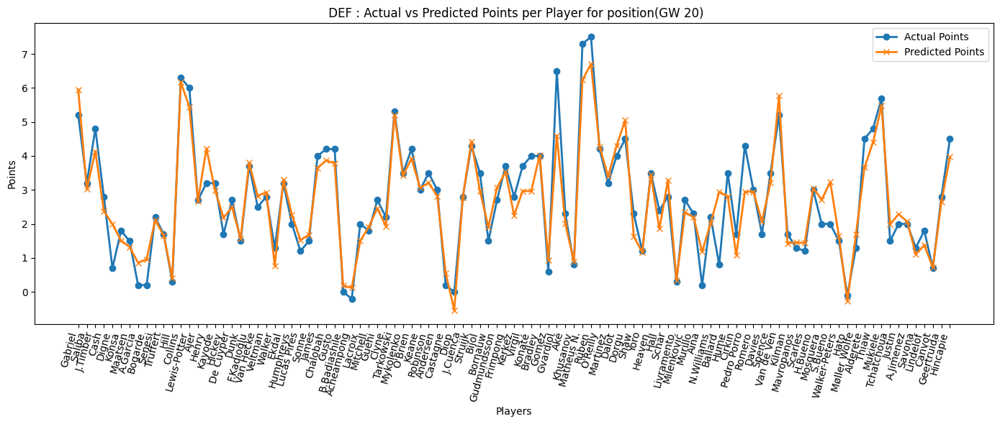

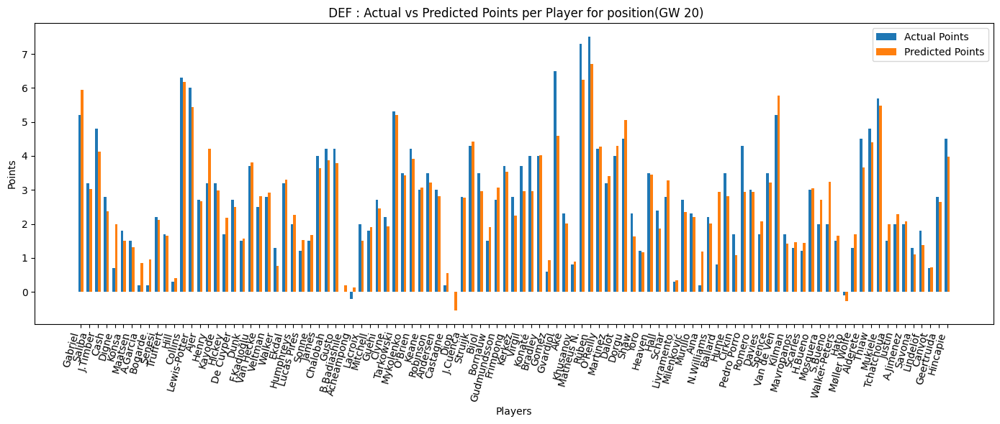

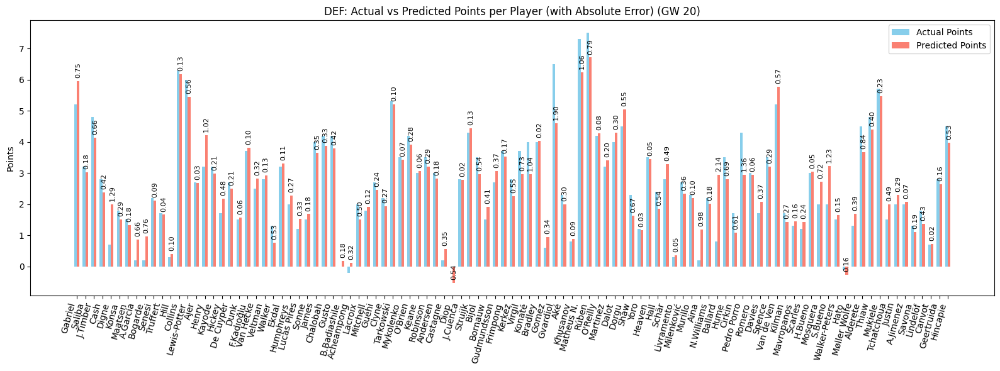

In [88]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


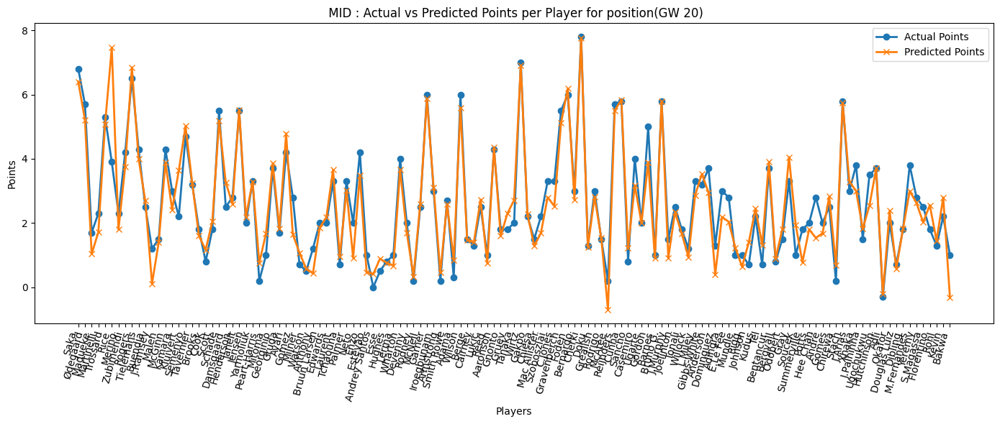

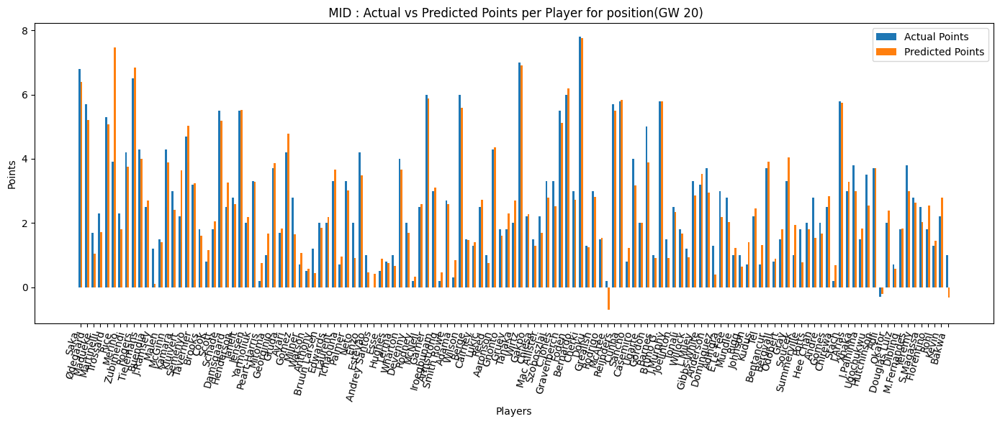

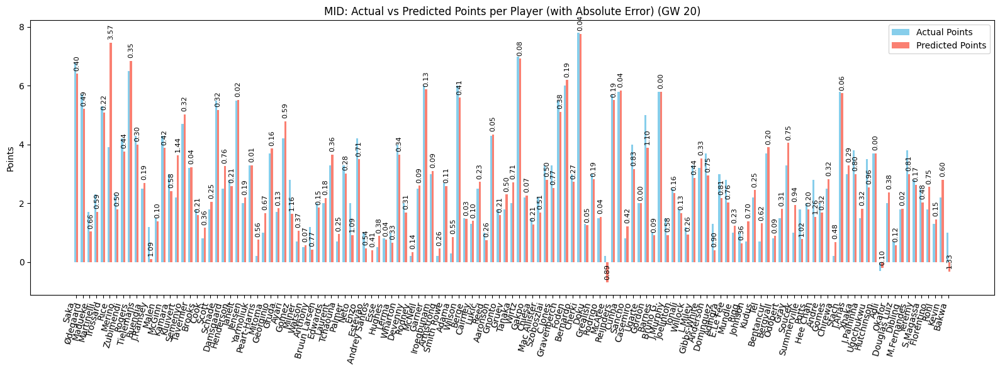

In [89]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


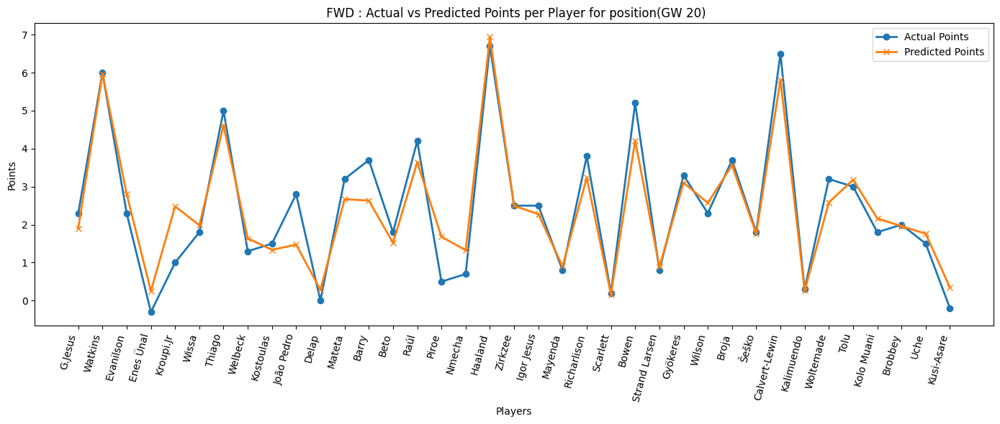

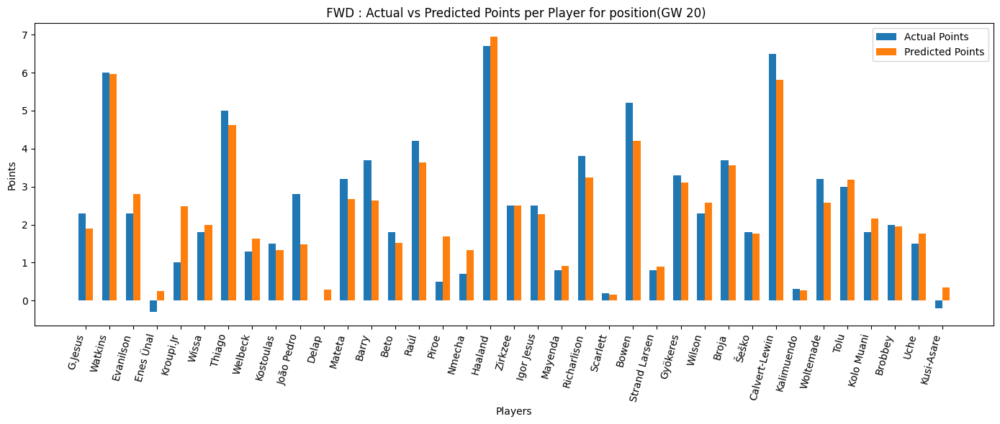

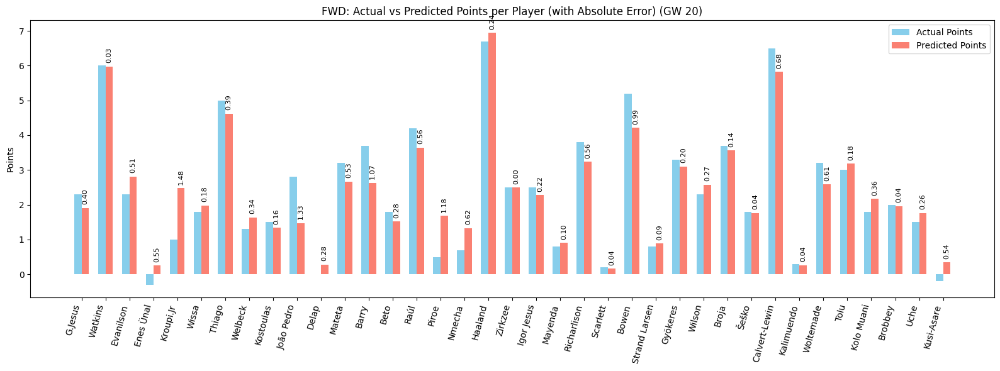

In [90]:
plot_preds(preds_df_20, 'FWD', 20)

#### Optimize


In [91]:
squad_20, total_points_20 = get_optimized_team(Y_pred_20, 20)
squad_20

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-283.4492
IRL epoch 100/200 loss=-3265.6714
IRL epoch 150/200 loss=-14279.9424
IRL epoch 200/200 loss=-39592.3516
HGAT Policy Embeddings Shape: torch.Size([291, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
           name         team position  price   xP_pred  is_captain  is_vice
4          Saka      Arsenal      MID   10.3  6.403857       False     True
149       Wirtz    Liverpool      MID    8.2  6.916321       False    False
20       Rogers  Aston Villa      MID    7.5  6.848526       False    False
9          Rice      Arsenal      MID    7.1  7.467287       False    False
164      Cherki     Man City      MID    6.8  7.759316        True    False
289  Donnarumma     Man City       GK    5.7  5.696737       False    False
170     Haaland     Man City      FWD   15.1  6.939605       False    False
27      Watkins  Aston Villa      FWD    8.6  5.970242       False    False
1       Gabriel      Arsenal      D

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Gabriel,Arsenal,DEF,5.949894,9.0,False,False
1,Saka,Arsenal,MID,6.403857,4.0,False,True
2,Rice,Arsenal,MID,7.467287,25.5,False,False
3,Rogers,Aston Villa,MID,6.848526,5.0,False,False
4,Watkins,Aston Villa,FWD,5.970242,7.0,False,False
5,Collins,Brentford,DEF,6.167051,10.0,False,False
6,Wirtz,Liverpool,MID,6.916321,10.0,False,False
7,Cherki,Man City,MID,7.759316,8.0,True,False
8,Haaland,Man City,FWD,6.939605,2.0,False,False
9,Van de Ven,Spurs,DEF,5.766495,7.0,False,False


In [92]:
total_points_16, total_points_17, total_points_18, total_points_19, total_points_20

(np.float64(131.0),
 np.float64(119.5),
 np.float64(71.0),
 np.float64(68.0),
 np.float64(89.5))

## Current


In [93]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 21)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Prediction
print("\nGenerating Predictions...")
Y_pred_21 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_21 = active_data['position'][test_mask]
teams_21 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_21, 'team': teams_21, 'position': position_21}
preds_df_21 = pd.DataFrame(players_preds)

# Results
results_df_21 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_21,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print(f"\n--- Results for Gameweek {gw} ---")
print(results_df_21.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))
results_df_21.sort_values(by='Predicted_xP', ascending=False)


Data prepared. X shape: (6634, 212), M shape: (6634, 3), Y shape: (6634, 2)

Generating Predictions...
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

--- Results for Gameweek 21 ---
 Gameweek      Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       21     Semenyo        0.0     19.290001       0.47     -0.32
       21     Gabriel        0.0     19.070000       1.10     -1.18
       21  João Pedro        0.0     18.809999       0.54     -0.37
       21   Reijnders        0.0     15.840000       1.34     -1.61
       21      Thiago        0.0     14.670000       0.89     -0.77
       21      Palmer        0.0     14.580000       0.54     -0.37
       21     Haaland        0.0     14.320000       1.34     -1.61
       21 B.Fernandes        0.0     14.260000       1.00     -1.00
       21        Saka        0.0     13.080000       1.10     -1.18
       21        Rice        0.0     12.130000       1.10     -1.18


,Gameweek,Player,Actual_xP,Predicted_xP,Team_Diff,Opp_Diff
60,21,Semenyo,0.0,19.289316,0.467272,-0.324175
3,21,Gabriel,0.0,19.066664,1.099035,-1.176174
180,21,João Pedro,0.0,18.813148,0.541262,-0.369615
316,21,Reijnders,0.0,15.842255,1.338080,-1.613533
98,21,Thiago,0.0,14.668736,0.894139,-0.767214
...,...,...,...,...,...,...
294,21,Danns,0.0,-0.712168,-1.188972,1.107183
269,21,Mamardashvili,0.0,-0.714858,-1.188972,1.107183
511,21,Leoni,0.0,-0.768225,-1.188972,1.107183
291,21,Endo,0.0,-1.061542,-1.188972,1.107183


#### Plots


###### GK


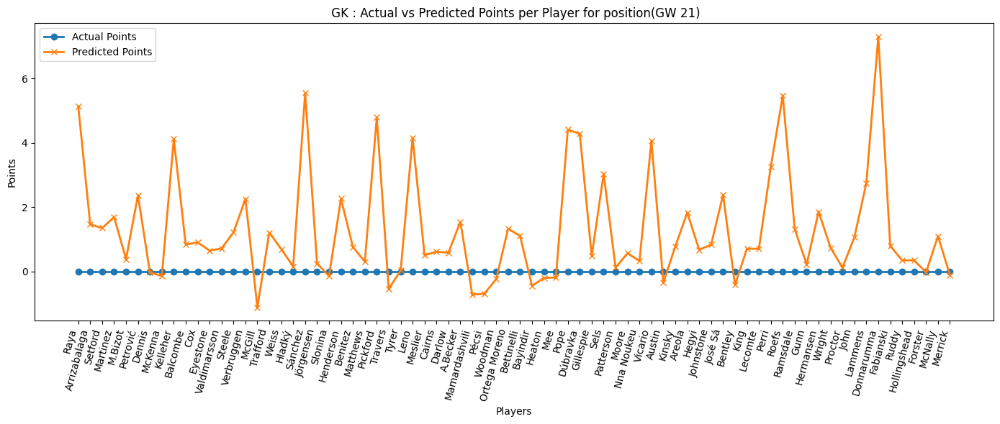

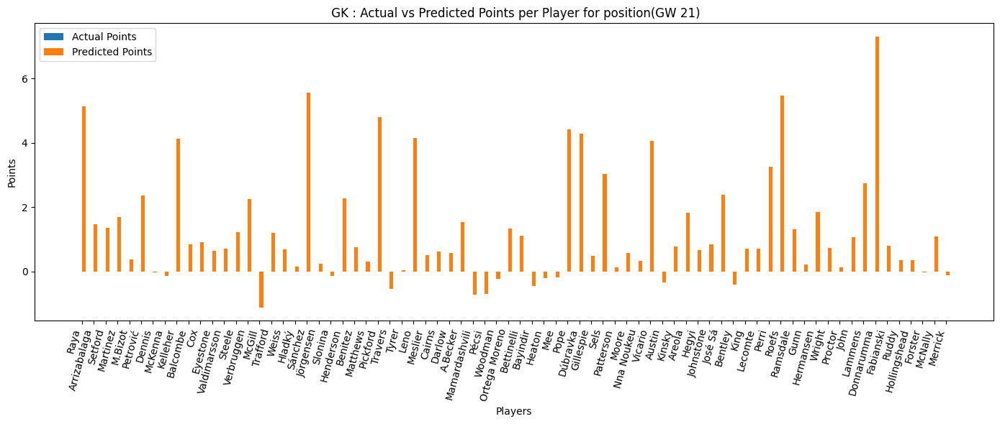

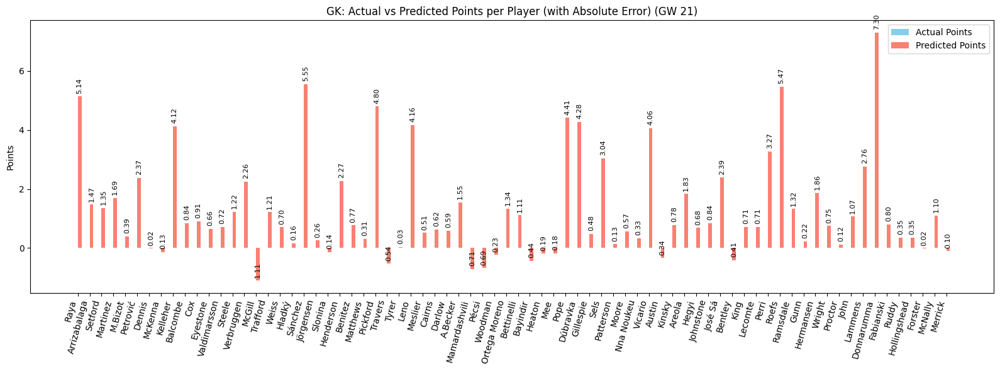

In [94]:
plot_preds(preds_df_21, 'GK', 21)


###### DEF


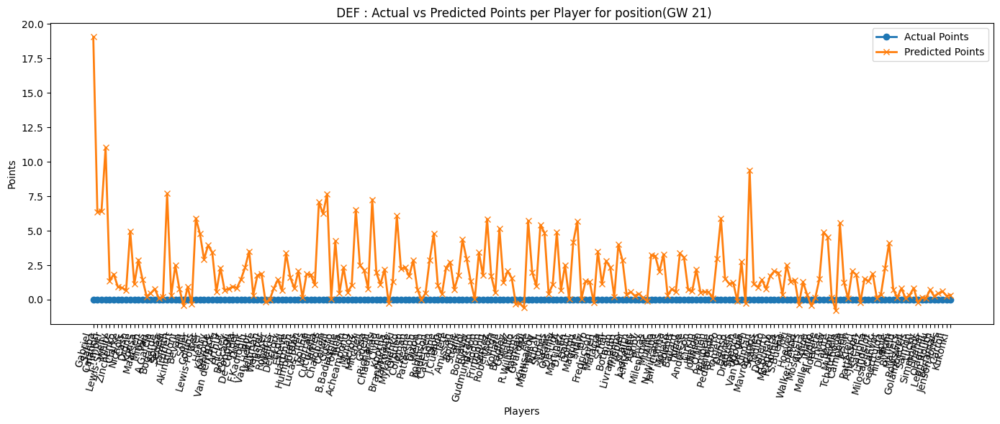

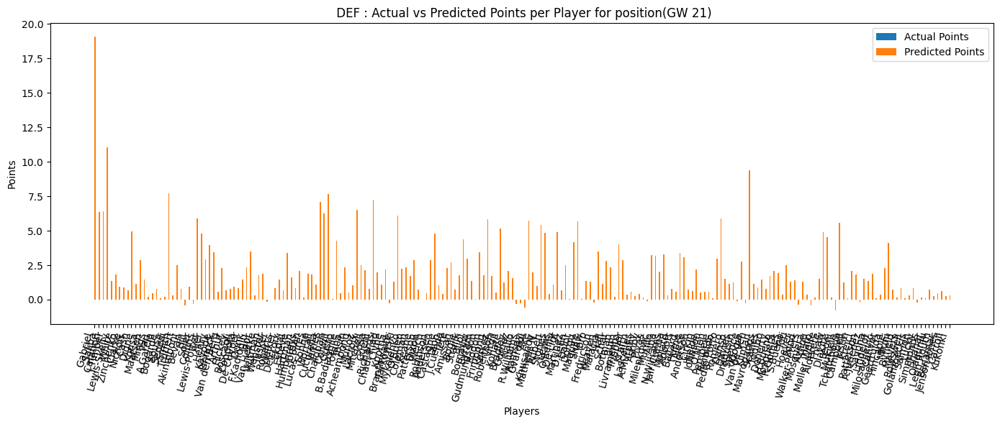

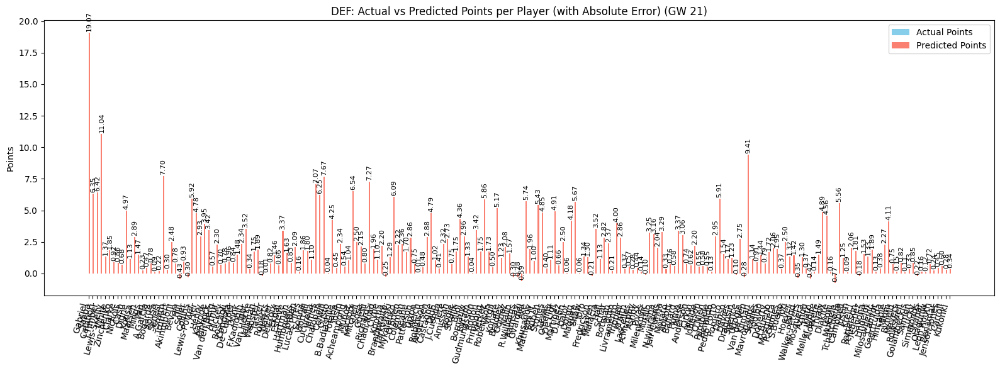

In [95]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


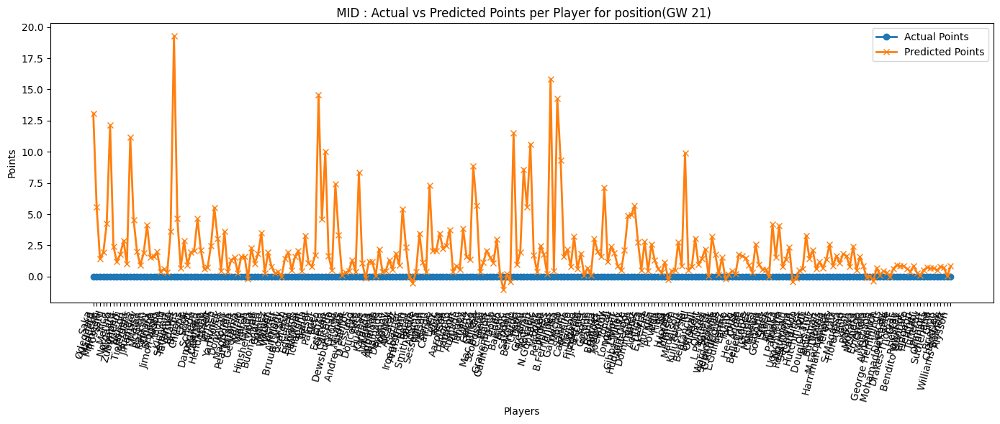

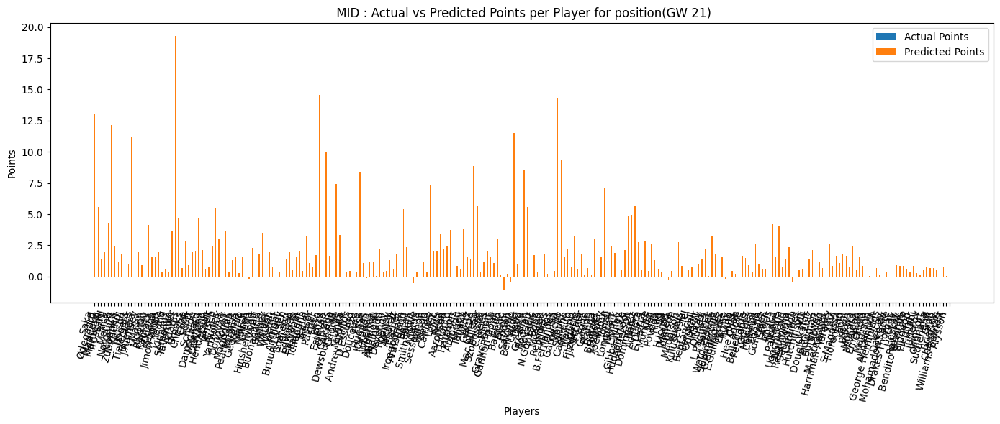

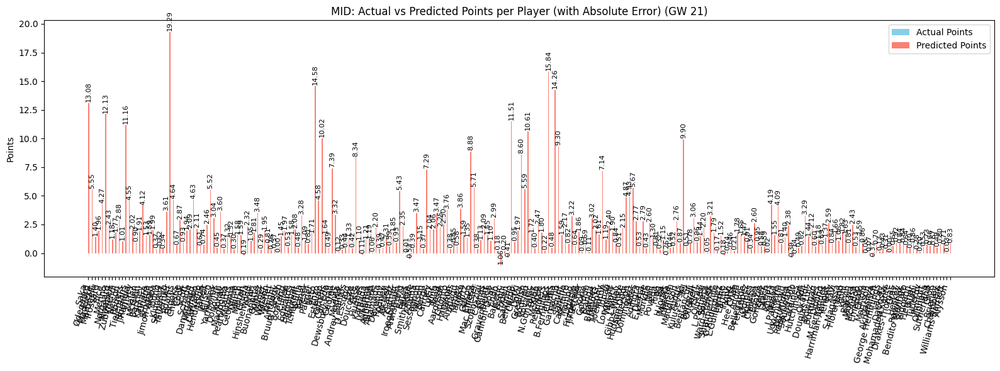

In [96]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


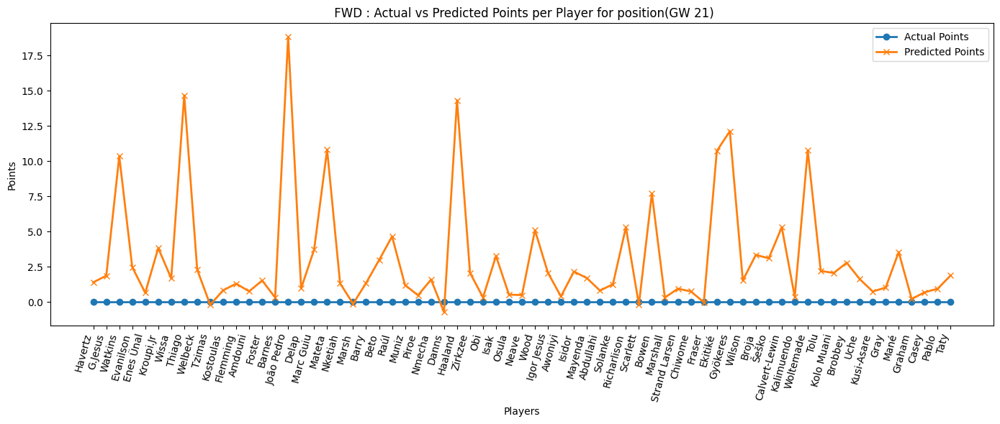

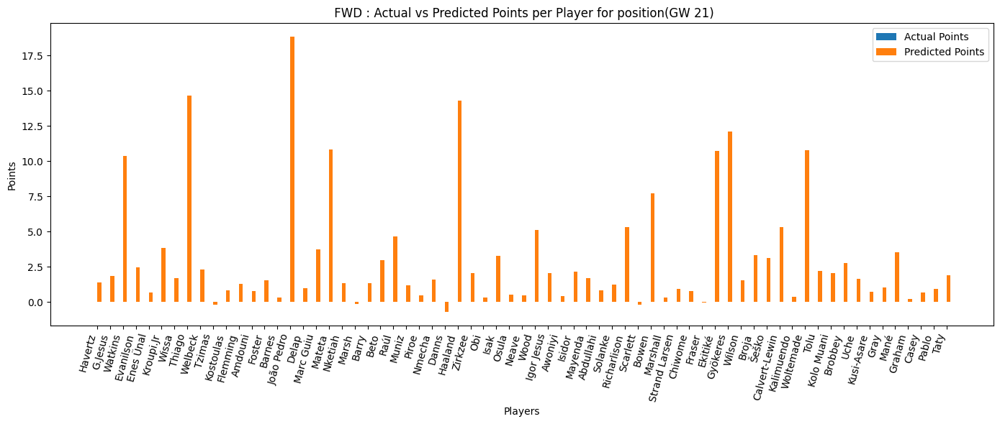

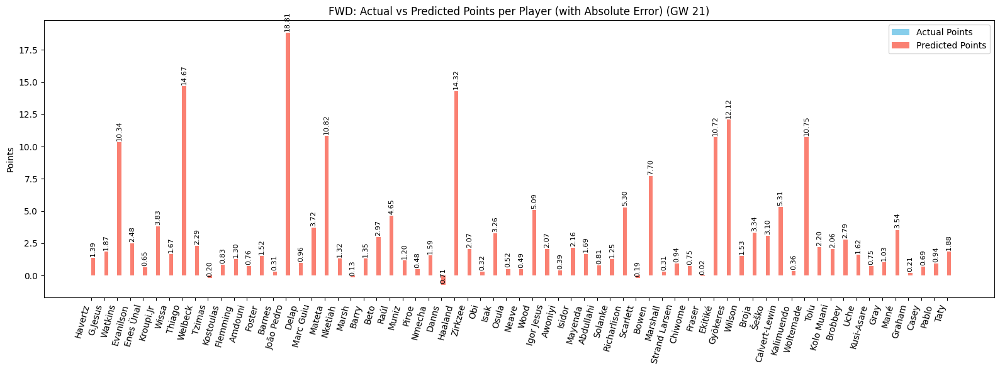

In [97]:
plot_preds(preds_df_21, 'FWD', 21)

#### Optimize


In [98]:
squad_21, total_points_21 = get_optimized_team(Y_pred_21, 21)
squad_21

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-655.0594
IRL epoch 100/200 loss=-6814.3364
IRL epoch 150/200 loss=-28566.5078
IRL epoch 200/200 loss=-77759.1484
HGAT Policy Embeddings Shape: torch.Size([607, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
            name         team position  price    xP_pred  is_captain  is_vice
168       Palmer      Chelsea      MID   10.4  14.584732       False    False
333  B.Fernandes      Man Utd      MID    9.1  14.261044       False    False
60       Semenyo  Bournemouth      MID    7.6  19.289316        True    False
316    Reijnders     Man City      MID    5.2  15.842255       False    False
550   Donnarumma     Man City       GK    5.7   7.299851       False    False
318      Haaland     Man City      FWD   15.1  14.318284       False    False
180   João Pedro      Chelsea      FWD    7.2  18.813148       False    False
98        Thiago    Brentford      FWD    7.0  14.668736       False    False
3        Gabriel 

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Gabriel,Arsenal,DEF,19.066664,0.0,False,True
1,J.Timber,Arsenal,DEF,11.042608,0.0,False,False
2,Semenyo,Bournemouth,MID,19.289316,0.0,True,False
3,Thiago,Brentford,FWD,14.668736,0.0,False,False
4,Palmer,Chelsea,MID,14.584732,0.0,False,False
5,João Pedro,Chelsea,FWD,18.813148,0.0,False,False
6,Reijnders,Man City,MID,15.842255,0.0,False,False
7,Haaland,Man City,FWD,14.318284,0.0,False,False
8,B.Fernandes,Man Utd,MID,14.261044,0.0,False,False
9,Van de Ven,Spurs,DEF,9.406087,0.0,False,False
